Welcome to **<font color="PINK">Group 14  </font>**'s Background Subtraction Project Documentation! 🚀

In this collaborative effort, our team delves into the fascinating realm of background subtraction—a powerful technique with versatile applications across various fields.

Background subtraction plays a pivotal role in image and video processing, enabling us to extract foreground objects by distinguishing them from the background. From computer vision to surveillance systems, its impact is profound.

Explore our meticulously documented code, where we navigate the intricacies of background subtraction, leveraging its potential to enhance and innovate in diverse domains.

Happy coding! 🌟

---



---



<font color="PINK">In the begining  </font>The below code cell snippet initializes the environment for a machine learning project, ensuring version compatibility, configuring plotting parameters, and setting up directories for images and TensorBoard logs. Its primary aim is to provide a structured and reproducible setup for running and documenting experiments in TensorFlow.
The code checks if it is running on Google Colab by inspecting the environment. If it detects that it's running on Colab, it configures certain aspects, such as mounting Google Drive, adjusting project directories, and printing relevant messages. This conditional logic allows the code to adapt to the Colab environment while remaining compatible with other Jupyter environments.

In [ ]:
from pkg_resources import parse_version
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3,5)

# Tensorflow ≥2.0 is required
# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
def reset_seed(seed=42):
    np.random.seed(seed)

# To plot pretty figures - source Aurelien Geron
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Where to save the figures
# Based on post by GM at https://stackoverflow.com/questions/53581278
if 'google.colab' in str(get_ipython()):
  print('Running on CoLab')
  from google.colab import drive
  # mount your google drive into colab
  # this is interactive unfortunately
  # must paste authorization code on prompt
  drive.mount('/content/drive')
  PROJECT_ROOT_DIR = "drive/MyDrive/Colab Notebooks"
else:
  print('Not running on CoLab')
  PROJECT_ROOT_DIR = os.getcwd()

NB_ID = "project"

# create the directory if it does not exist
IMAGE_DIR = os.path.join(PROJECT_ROOT_DIR, "images", NB_ID)
os.makedirs(IMAGE_DIR, exist_ok = True)

def save_fig_nb(fig_id, tight_layout=True):
    path = os.path.join(IMAGE_DIR, fig_id + ".png")
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format='png', dpi=300)

os.makedirs(os.path.join(PROJECT_ROOT_DIR,"tb_logs",NB_ID), exist_ok = True)

def get_logdir(add=''):
    import time
    log_id = time.strftime("log_%Y_%m_%d-%H_%M_%S")
    return os.path.join(PROJECT_ROOT_DIR,"tb_logs",NB_ID,log_id+add)

Not running on CoLab


⛳ Beause we might work on local , we had to install important libraries as matplotlib and others

In [ ]:
pip install matplotlib


Note: you may need to restart the kernel to use updated packages.


In [114]:
import pandas as pd
import matplotlib.pyplot as plt


In [108]:
import os
import tensorflow as tf #for the TensorFlow framework.
import tensorflow_datasets as tfds  #for accessing and managing machine learning datasets provided by TensorFlow.


# # For some reason we seem to need to load tf onto the GPU first
# dummy = tf.constant( 32 )
# print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

🛑 These functions provide utility for plotting images:

plot_image(image): Displays a grayscale image using Matplotlib with options for colormap and interpolation.
plot_color_image(image): Displays a color image using Matplotlib with axis turned off.

The plot_cm function generates a heatmap visualization of a confusion matrix, providing a clear representation of the relationships between predicted and true labels in a classification task that will be used in modeling

In [ ]:
def plot_image(image):
    plt.imshow(image, cmap="gray", interpolation="nearest")
    plt.axis("off")

def plot_color_image(image):
    plt.imshow(image)
    plt.axis("off")

In [ ]:
def plot_cm(confusion_matrix,title):
  plt.figure(figsize=(8,6))
  sns.heatmap(confusion_matrix,annot=True,fmt='d',cmap="Blues")
  plt.title(title)
  plt.xlabel("Predicted label")
  plt.ylabel('True label')
  plt.show()

🛑This code segment configures TensorFlow Datasets and loads three datasets ('linear_movement_rotate', 'rotation_rotate', and 'fixed_random_rotate') from a specified directory. It also sets up iterators for each dataset and collects all the video data into corresponding lists for further processing. The tfds.disable_progress_bar() function is used to suppress the progress bar during dataset loading. The data is organized into three sets: linear movement, rotation, and fixed random rotation.

In [ ]:
tfds.disable_progress_bar()

print(PROJECT_ROOT_DIR)
PROJECT_ROOT_DIR = r'C:\Users\aa\Desktop\background'
data_path = os.path.join(PROJECT_ROOT_DIR, 'tensorflow_data')
os.makedirs(data_path, exist_ok=True)

print("Using directory: ", data_path)

linear_set = tfds.load('elg7186_projectdata/linear_movement_rotate', data_dir=data_path)
rotation_set = tfds.load('elg7186_projectdata/rotation_rotate', data_dir=data_path)
fixed_set = tfds.load('elg7186_projectdata/fixed_random_rotate', data_dir=data_path)

# Set up iterators over the data
iter_data_linear = iter(linear_set['train'])
iter_data_rotation = iter(rotation_set['train'])
iter_data_fixed = iter(fixed_set['train'])

# Get all videos and append them to lists
train_data_linear = [data for data in iter_data_linear]
train_data_rotation = [data for data in iter_data_rotation]
train_data_fixed = [data for data in iter_data_fixed]


c:\Users\aa\Desktop\background
Using directory:  C:\Users\aa\Desktop\background\tensorflow_data


 ▶we have three folders for example train_data_linear which has 30 videos and each video has 24 frame

In [ ]:
len(train_data_linear[29]['video'])
len(train_data_linear)

🛑This code is for displaying examples of each type of camera dataset. It creates a subplot with three columns, where each column corresponds to a different type of camera movement: linear, rotation, and fixed random rotation. It then plots the first frame of the first video in each dataset along with a title indicating the type of camera movement. The purpose is to visually showcase examples from each dataset for better understanding and inspection.

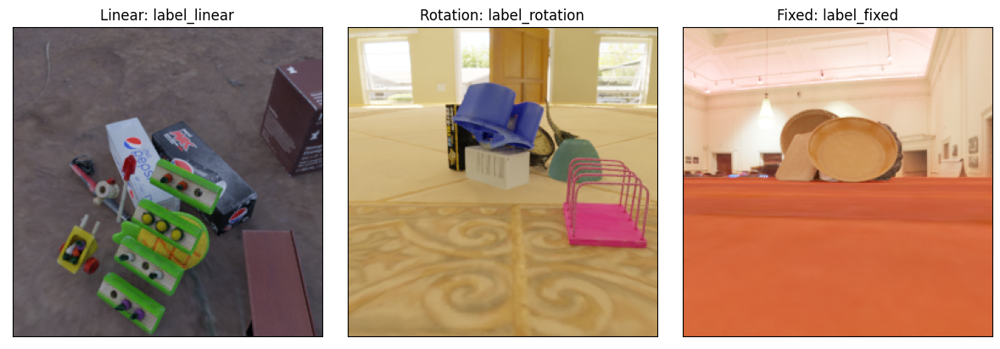

In [ ]:
#showing examples of each type of the camera
# Create subplots with 1 row and 3 columns
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

# Plot the first image and its label on the first subplot
axs[0].imshow(train_data_linear[0]['video'][0, :, :, :])
axs[0].set_title('Linear: {}'.format("label_linear"))

# Plot the second image and its label on the second subplot
axs[1].imshow(train_data_rotation[0]['video'][0, :, :, :])
axs[1].set_title('Rotation: {}'.format("label_rotation"))

# Plot the third image and its label on the third subplot
axs[2].imshow(train_data_fixed[0]['video'][0, :, :, :])
axs[2].set_title('Fixed: {}'.format("label_fixed"))

# Hide axis labels and ticks for all subplots
for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

# Display the subplots
plt.tight_layout()
plt.show()


▶ upload the others notebook which are flow_util and flow_vis which are important in our project and instead of uploaded it each time manually we used local path to help us

In [ ]:
# Hardcoded file path to the Python file
file_path = r"C:\Users\aa\Desktop\background\flow_util.py"

# Read the content of the specified file
with open(file_path, 'rb') as file:
    src = file.read()

# Save the content to a local file
with open('flow_util.py', 'wb') as output_file:
    output_file.write(src)

# Import the locally saved module
import flow_util

In [ ]:
# Hardcoded file path to the Python file
file_path = r"C:\Users\aa\Desktop\background\flow_vis.py"

# Read the content of the specified file
with open(file_path, 'rb') as file:
    src = file.read()

# Save the content to a local file
with open('flow_vis.py', 'wb') as output_file:
    output_file.write(src)

# Import the locally saved module
import flow_vis

#**<font color="lightcoral">Segmentation and separating background and foreground </font>**

## **<font color="PINK">Linear </font>**


🛑This code snippet processes and visualizes segmentation results for the linear movement dataset. It iterates through the frames of each video in the dataset, displaying the original video frames, segmentation masks, and processed binary masks indicating foreground and background. The images are arranged in a grid, and the resulting visualizations are saved for further analysis. The flow_util module is used for utility functions related to flow visualization. Additionally, the flow_vis library is mentioned in the comments, suggesting that it may be used for flow vector coloring, although it is not explicitly used in this snippet.

In [ ]:
import numpy as np
# flow_vis library implements Middlebury flow vector coloring
import flow_vis
# Maybe use flowpy instead which can read/write png and flo files in KITTI and Middleburry format respectively.
from flow_util import *
import matplotlib.patches as patches

# video_name, video_type = get_video_names( train_data_linear[0]['metadata'] )
# f_scale, f_offset = get_scale_offset( train_data_linear[0]['metadata'] )

# num_frames = int(train_data_linear[0]['metadata']['num_frames'])
# resolution = [train_data_linear[0]['metadata']['height'], train_data_linear[0]['metadata']['width']]

# print('resolution:', resolution)
x_mesh = np.empty(1)
y_mesh = np.empty(1)

linear_images = []
linear_foreback = []

n_cols = 4

for j in range(len(train_data_linear)):
  video_name, video_type = get_video_names( train_data_linear[j]['metadata'] )
  f_scale, f_offset = get_scale_offset( train_data_linear[j]['metadata'] )

  num_frames = int(train_data_linear[j]['metadata']['num_frames'])
  resolution = [train_data_linear[j]['metadata']['height'], train_data_linear[j]['metadata']['width']]

  print('resolution:', resolution)
  figId = plt.figure(figsize=(n_cols, num_frames))

  plt.subplots_adjust(wspace=0, hspace=0)
  for i in range(num_frames):
      img_cnt = i*n_cols
      _ = plt.subplot(num_frames, n_cols, img_cnt+1)
      plt.imshow(train_data_linear[j]['video'][i, :, :, :])
      linear_images.append(np.array(train_data_linear[j]['video'][i, :, :, :]))
      plt.axis("off")

      ax2 = plt.subplot(num_frames, n_cols, img_cnt+2)
      segmentation = train_data_linear[j]['segmentations'][i, :, :, :].numpy()
      plt.imshow(segmentation)

      plt.axis("off")
      plt.axis("equal")
      plt.axis("off")

      # Add your third column here
      ax3 = plt.subplot(num_frames, n_cols, img_cnt + 3)  # New column
      processed_image_array = np.where(segmentation < 1, 0, 1)
      linear_foreback.append(processed_image_array)
      plt.imshow(processed_image_array)
      plt.axis("off")

  save_video_fig(figId, video_name + '_seg', video_type, IMAGE_DIR)
  # plt.clf()


🛑 The len(linear_images) query returns the total count of images stored in the linear_images list, while the subsequent code visualizes the segmentation mask for a specific frame in the linear movement dataset using Matplotlib.

In [ ]:
len(linear_images)

720

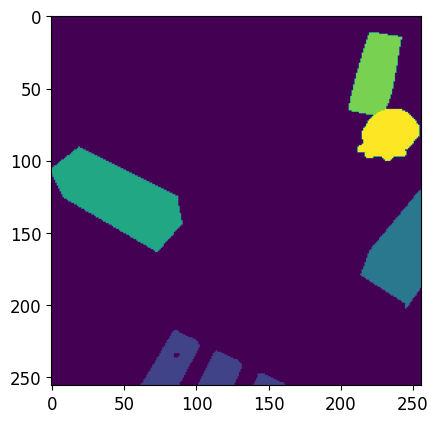

In [ ]:
segmentation = train_data_linear[0]['segmentations'][i, :, :, :].numpy()
plt.imshow(segmentation)
# train_data_linear['segmentations']

## **<font color="PINK">Rotation </font>**

🛑As we done in linear, we are going to do the same for Rotation
it processes and visualizes segmentation results for the rotation movement dataset. Similar to the previous snippet, it iterates through the frames of each video, displaying the original frames, segmentation masks, and processed binary masks indicating foreground and background. The resulting visualizations are saved for further analysis, with images arranged in a grid.
The len(rotation_images) query returns the total count of images stored in the rotation_images list

In [ ]:
import numpy as np
# flow_vis library implements Middlebury flow vector coloring
import flow_vis
# Maybe use flowpy instead which can read/write png and flo files in KITTI and Middleburry format respectively.
from flow_util import *
import matplotlib.patches as patches


x_mesh = np.empty(1)
y_mesh = np.empty(1)

rotation_images = []
rotation_foreback = []

n_cols = 3


for j in range(len(train_data_rotation)):
  video_name, video_type = get_video_names( train_data_rotation[j]['metadata'] )
  f_scale, f_offset = get_scale_offset( train_data_rotation[j]['metadata'] )

  num_frames = int(train_data_rotation[j]['metadata']['num_frames'])
  resolution = [train_data_rotation[j]['metadata']['height'], train_data_rotation[j]['metadata']['width']]

  print('resolution:', resolution)


  figId = plt.figure(figsize=(n_cols, num_frames))
  plt.subplots_adjust(wspace=0, hspace=0)
  for i in range(num_frames):
      img_cnt = i*n_cols
      _ = plt.subplot(num_frames, n_cols, img_cnt+1)
      plt.imshow(train_data_rotation[j]['video'][i, :, :, :])
      rotation_images.append(np.array(train_data_rotation[j]['video'][i, :, :, :]))
      plt.axis("off")

      ax2 = plt.subplot(num_frames, n_cols, img_cnt+2)
      segmentation = train_data_rotation[j]['segmentations'][i, :, :, :].numpy()
      plt.imshow(segmentation)

      plt.axis("off")
      plt.axis("equal")
      plt.axis("off")

      # Add your third column here
      ax3 = plt.subplot(num_frames, n_cols, img_cnt + 3)  # New column
      processed_image_array = np.where(segmentation < 1, 0, 1)
      rotation_foreback.append(processed_image_array)
      plt.imshow(processed_image_array)
      plt.axis("off")

  save_video_fig(figId, video_name + '_seg', video_type, IMAGE_DIR)


In [ ]:
len(rotation_images)

720

## **<font color="PINK">Fixed </font>**

🛑 As the two previous ones , we are going to do the same with fixed
then visualize the segmentation mask for a specific frame in the fixed movement dataset

Video:  0003
Video type:  fixed_random_rotate_007
forward_flow range -16.59033203125 to 16.885251998901367
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0003_seg


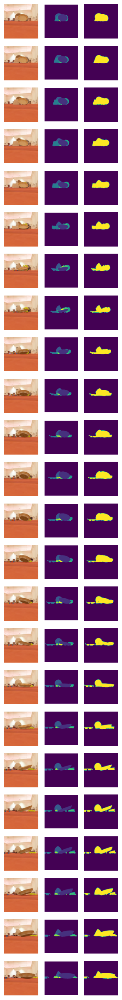

Video:  0006
Video type:  fixed_random_rotate_003
forward_flow range -15.715254783630371 to 53.34239959716797
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0006_seg


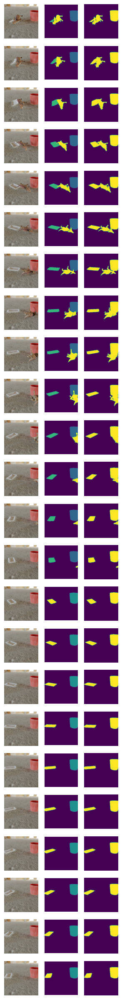

Video:  0001
Video type:  fixed_random_rotate_003
forward_flow range -13.709030151367188 to 19.553253173828125
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0001_seg


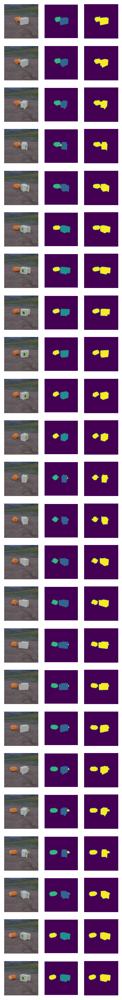

Video:  0008
Video type:  fixed_random_rotate_007
forward_flow range -14.55420207977295 to 18.55986213684082
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0008_seg


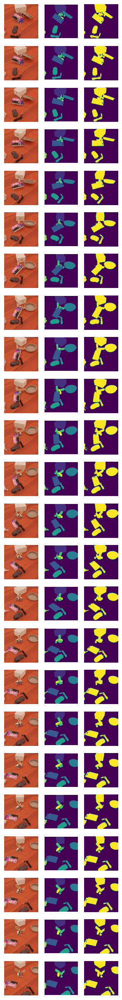

Video:  0009
Video type:  fixed_random_rotate_001
forward_flow range -15.778400421142578 to 26.016069412231445
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0009_seg


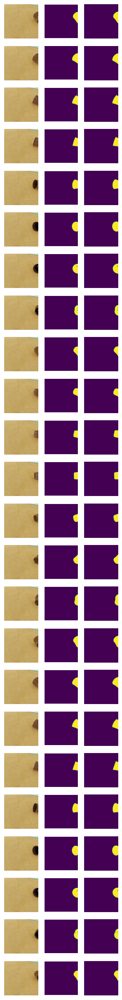

Video:  0006
Video type:  fixed_random_rotate_001
forward_flow range -13.675872802734375 to 17.148502349853516
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0006_seg


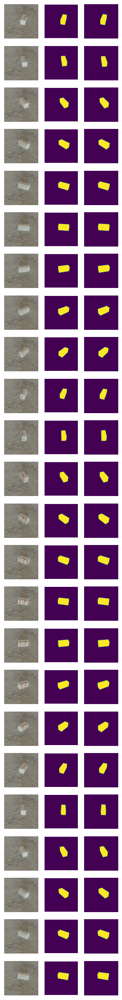

Video:  0002
Video type:  fixed_random_rotate_007
forward_flow range -15.914144515991211 to 72.61532592773438
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0002_seg


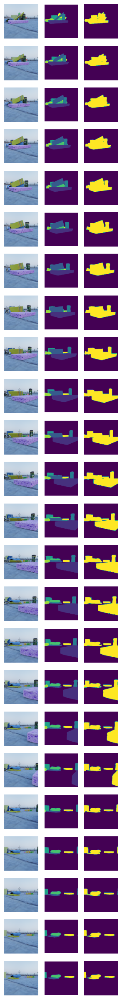

Video:  0006
Video type:  fixed_random_rotate_007
forward_flow range -22.384580612182617 to 36.704383850097656
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0006_seg


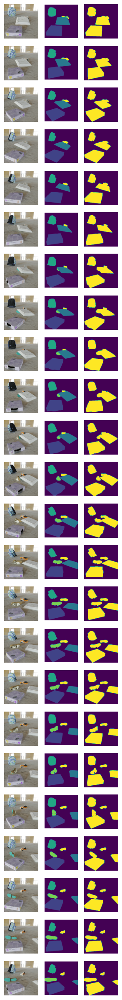

Video:  0005
Video type:  fixed_random_rotate_001
forward_flow range -11.667259216308594 to 15.498320579528809
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0005_seg


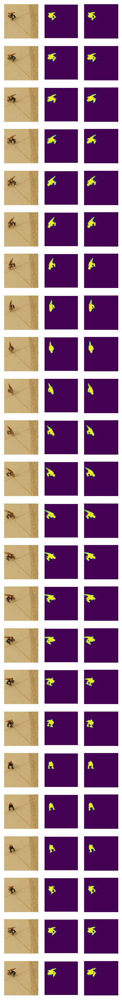

Video:  0005
Video type:  fixed_random_rotate_003
forward_flow range -18.310819625854492 to 31.71592140197754
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0005_seg


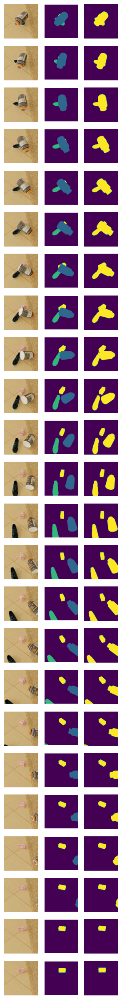

Video:  0002
Video type:  fixed_random_rotate_003
forward_flow range -10.813050270080566 to 8.727499008178711
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0002_seg


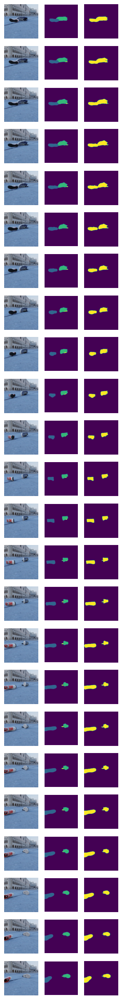

Video:  0007
Video type:  fixed_random_rotate_001
forward_flow range -15.699268341064453 to 23.305383682250977
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0007_seg


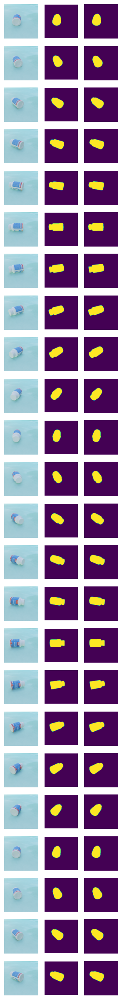

Video:  0000
Video type:  fixed_random_rotate_001
forward_flow range -9.85097885131836 to 14.710131645202637
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0000_seg


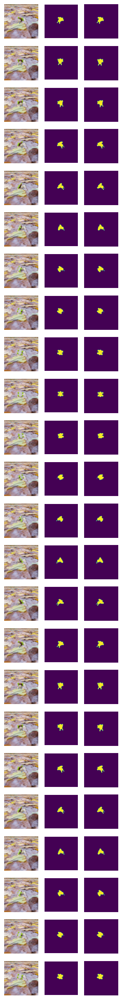

Video:  0008
Video type:  fixed_random_rotate_001
forward_flow range -9.174051284790039 to 13.012357711791992
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0008_seg


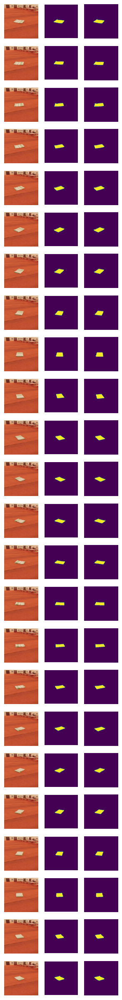

Video:  0003
Video type:  fixed_random_rotate_003
forward_flow range -16.72107696533203 to 39.14979934692383
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0003_seg


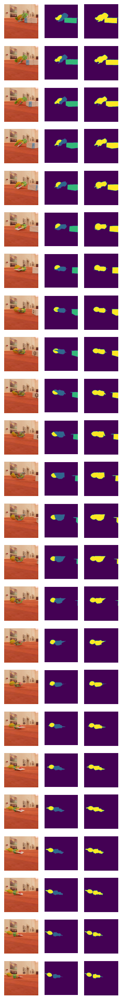

Video:  0001
Video type:  fixed_random_rotate_007
forward_flow range -19.288963317871094 to 28.504154205322266
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0001_seg


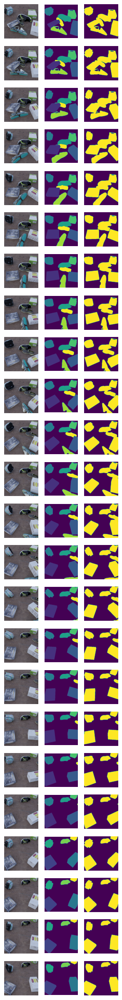

Video:  0001
Video type:  fixed_random_rotate_001
forward_flow range -14.6871976852417 to 20.70049476623535
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0001_seg


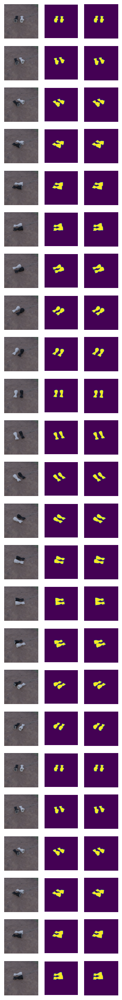

Video:  0004
Video type:  fixed_random_rotate_001
forward_flow range -7.485585689544678 to 11.931289672851562
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0004_seg


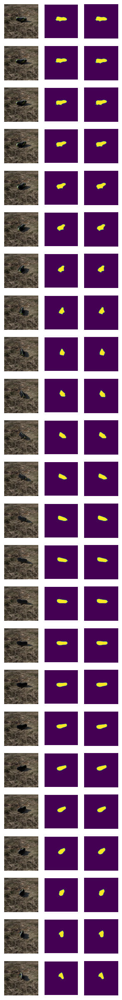

Video:  0007
Video type:  fixed_random_rotate_003
forward_flow range -19.69915008544922 to 34.36061096191406
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0007_seg


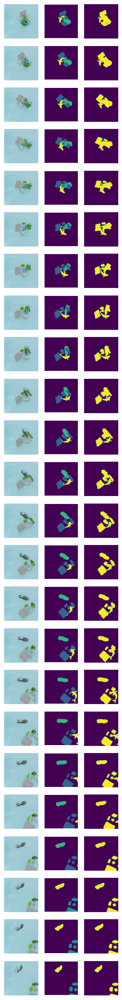

Video:  0009
Video type:  fixed_random_rotate_003
forward_flow range -10.899267196655273 to 17.52436065673828
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0009_seg


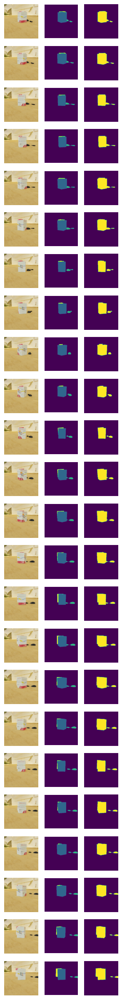

Video:  0002
Video type:  fixed_random_rotate_001
forward_flow range -12.70972728729248 to 18.594472885131836
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0002_seg


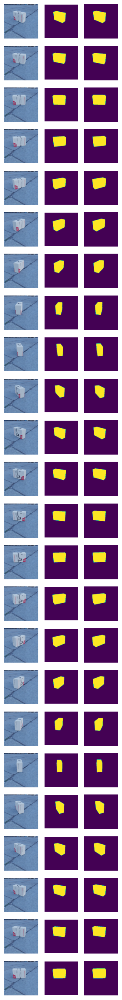

Video:  0000
Video type:  fixed_random_rotate_003
forward_flow range -19.10961151123047 to 29.663026809692383
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0000_seg


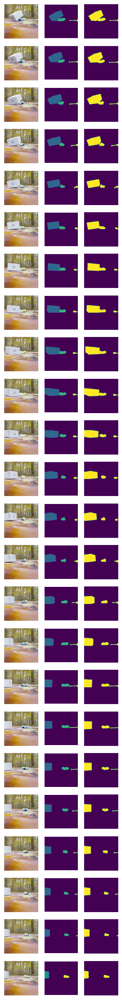

Video:  0000
Video type:  fixed_random_rotate_007
forward_flow range -18.187406539916992 to 26.269176483154297
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0000_seg


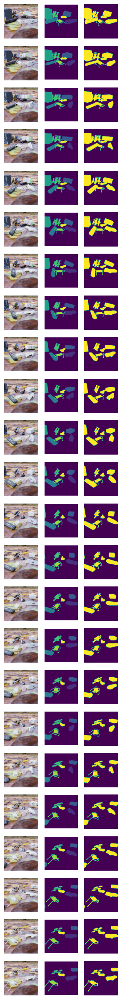

Video:  0008
Video type:  fixed_random_rotate_003
forward_flow range -21.39022445678711 to 18.87179183959961
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0008_seg


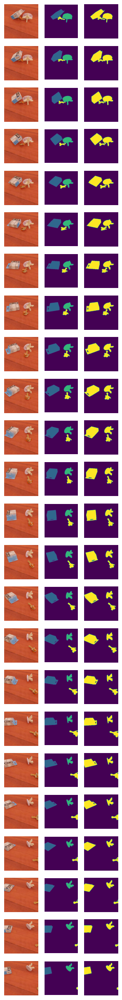

Video:  0005
Video type:  fixed_random_rotate_007
forward_flow range -15.855274200439453 to 17.19505500793457
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0005_seg


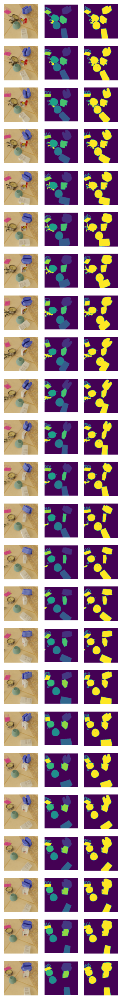

Video:  0007
Video type:  fixed_random_rotate_007
forward_flow range -13.058328628540039 to 36.292842864990234
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0007_seg


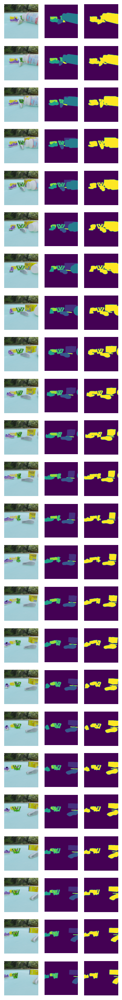

Video:  0004
Video type:  fixed_random_rotate_007
forward_flow range -10.230171203613281 to 15.253071784973145
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0004_seg


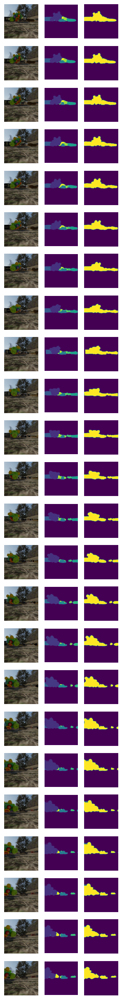

Video:  0009
Video type:  fixed_random_rotate_007
forward_flow range -27.63808822631836 to 85.95539855957031
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0009_seg


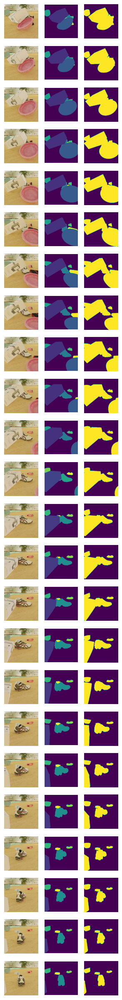

Video:  0004
Video type:  fixed_random_rotate_003
forward_flow range -20.731210708618164 to 41.94972229003906
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0004_seg


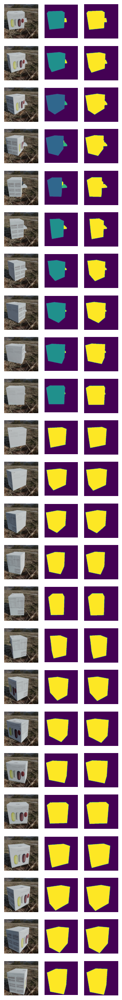

Video:  0003
Video type:  fixed_random_rotate_001
forward_flow range -7.0100417137146 to 8.596756935119629
resolution: [<tf.Tensor: shape=(), dtype=int32, numpy=256>, <tf.Tensor: shape=(), dtype=int32, numpy=256>]
Saving figure 0003_seg


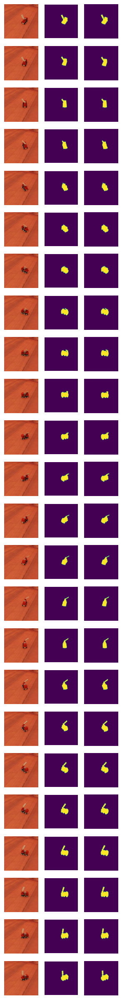

In [ ]:
import numpy as np
import flow_vis
from flow_util import *
import matplotlib.patches as patches


x_mesh = np.empty(1)
y_mesh = np.empty(1)

fixed_images = []
fixed_foreback = []

n_cols = 4  # Increase the number of columns to 4
for j in range(len(train_data_fixed)):
  video_name, video_type = get_video_names(train_data_fixed[j]['metadata'])
  f_scale, f_offset = get_scale_offset(train_data_fixed[j]['metadata'])

  num_frames = int(train_data_fixed[j]['metadata']['num_frames'])
  resolution = [train_data_fixed[j]['metadata']['height'], train_data_fixed[j]['metadata']['width']]

  print('resolution:', resolution)

  figId = plt.figure(figsize=(n_cols, num_frames))

  plt.subplots_adjust(wspace=0.1, hspace=0.1)

  for i in range(num_frames ):
      img_cnt = i * n_cols
      _ = plt.subplot(num_frames, n_cols, img_cnt + 1)
      plt.imshow(train_data_fixed[j]['video'][i, :, :, :])
      fixed_images.append(np.array(train_data_fixed[j]['video'][i, :, :, :]))
      plt.axis("off")

      ax2 = plt.subplot(num_frames, n_cols, img_cnt + 2)
      segmentation = train_data_fixed[j]['segmentations'][i, :, :, :].numpy()
      processed_image_array = np.where(segmentation < 1, 0, 1)
      plt.imshow(segmentation)
      plt.axis("off")
      plt.axis("equal")
      plt.axis("off")

      # Add your third column here
      ax3 = plt.subplot(num_frames, n_cols, img_cnt + 3)  # New column
      processed_image_array = np.where(segmentation < 1, 0, 1)
      fixed_foreback.append(processed_image_array)
      plt.imshow(processed_image_array)
      plt.axis("off")

  # Add the save function here
  save_video_fig(figId, video_name + '_seg', video_type, IMAGE_DIR)

  # Show the plot
  plt.show()


In [ ]:
len(fixed_images)

720

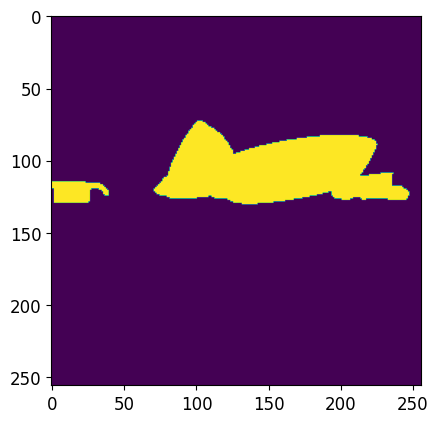

In [ ]:
# fixed_foreback[1]
plt.imshow(fixed_foreback[22])

## **<font color="lightcoral">Combining lists to make dataframe </font>**

🛑preparing the video frames to be added to data frame, in addition to their labels if they are fixed,linear or even rotated
and doing the same thing to segmentation data
This code snippet combines the processed binary masks (indicating foreground and background) from the fixed_foreback, linear_foreback, and rotation_foreback lists into a single list named combined_foreback_lists. The code then displays an example image from the combined list using Matplotlib. This aggregation of masks likely facilitates further analysis or comparison across different types of camera movement datasets.

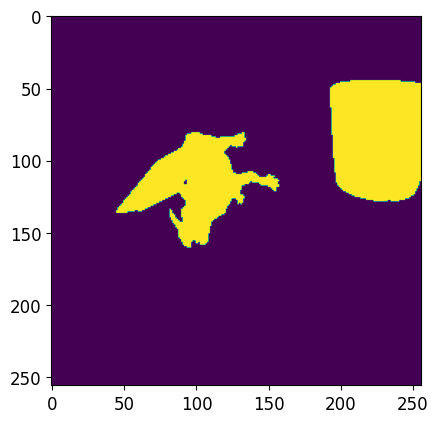

In [ ]:
# linear_foreback
# rotation_foreback
# fixed_foreback

# Initialize an empty list
combined_foreback_lists = []

# Combine the elements of all three lists
combined_foreback_lists.extend(fixed_foreback)
combined_foreback_lists.extend(linear_foreback)
combined_foreback_lists.extend(rotation_foreback)


# Access the elements of the combined list
# for element in combined_foreback_lists:
#     print(element)

# combined_foreback_lists[5]
plt.imshow(combined_foreback_lists[25])

In [ ]:
# fixed_images
# linear_images
# rotation_images

# Initialize an empty list
combined_images_lists = []

# Combine the elements of all three lists
combined_images_lists.extend(fixed_images)
combined_images_lists.extend(linear_images)
combined_images_lists.extend(rotation_images)


# Access the elements of the combined list
# for element in combined_images_lists:
#     print(element)

# combined_images_lists[5]
# plt.imshow(combined_images_lists[52])

🛑The length of combined_images_lists represents the total count of images obtained from the aggregation of the fixed_images, linear_images, and rotation_images lists. we have 2160 images

then we convert our data into dataframes to be easier in using for further operation

after that the  subsequent code  accesses the shape of the image in the second row of the 'Images' column. This operation provides information about the dimensions of the image array at that specific row in the DataFrame to more understaing of our data.

In [ ]:
len(combined_images_lists)

2160

In [ ]:
import pandas as pd

# Create a dictionary containing 'Images' and 'labels'
data = {
    'Images': combined_images_lists,
    'labels': combined_foreback_lists
}

# Create the DataFrame
df = pd.DataFrame(data)


In [ ]:
# df.head()

In [ ]:
(df.iloc[1,0]).shape

(256, 256, 3)

## **<font color="lightcoral">Preprocessing </font>**






---


1- converting to gray scale


---


2-applying histogram equalization


---


3-applying temporal filering to sequence frames


---





🛑This code employs the convert_to_grayscale function to transform each RGB image in the 'Images' column of a Pandas DataFrame into grayscale, storing the results in a new 'Grayscale' column. A grayscale image is then displayed from the DataFrame using Matplotlib for visual inspection.

In [ ]:
from skimage.color import rgb2gray

def convert_to_grayscale(rgb_image):
    grayscale_image = rgb2gray(rgb_image)
    return grayscale_image

# Apply the function to convert each image in the 'Images' column to grayscale
df['Grayscale'] = df['Images'].apply(convert_to_grayscale)

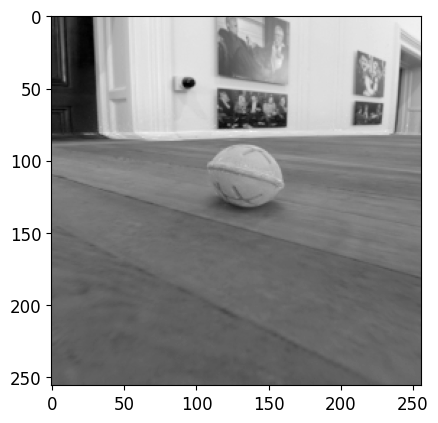

In [ ]:
plt.imshow(df['Grayscale'][1110],cmap='gray')

In [ ]:
grayscale_images=df['Grayscale']

In [ ]:
grayscale_images

0       [[0.8089117647058823, 0.8024752941176471, 0.80...
1       [[0.8089117647058823, 0.8024752941176471, 0.80...
2       [[0.8089117647058823, 0.8024752941176471, 0.80...
3       [[0.8089117647058823, 0.8024752941176471, 0.80...
4       [[0.8089117647058823, 0.8024752941176471, 0.80...
                              ...                        
2155    [[0.3734180392156863, 0.3630898039215686, 0.34...
2156    [[0.42101254901960783, 0.4173737254901961, 0.4...
2157    [[0.42577529411764703, 0.42577529411764703, 0....
2158    [[0.40618235294117644, 0.4089878431372549, 0.4...
2159    [[0.4227019607843137, 0.4176643137254902, 0.42...
Name: Grayscale, Length: 2160, dtype: object

🛑apply histogram equalization to each grayscale image in the 'Grayscale' column of a Pandas DataFrame, storing the results in a new column named 'Equalized Grayscale', visualizes a sample for examination.

In [ ]:
from skimage import exposure
def convert_to_grayscale_and_equalize_hist(gray_images):
    # grayscale_image = rgb2gray(rgb_image)
    equalized_image = exposure.equalize_hist(gray_images)
    return equalized_image

# Apply the function to convert each image in the 'Images' column to grayscale and equalize histogram
df['Equalized Grayscale'] = df['Grayscale'].apply(convert_to_grayscale_and_equalize_hist)


In [ ]:
df['Grayscale'].head()

0    [[0.8089117647058823, 0.8024752941176471, 0.80...
1    [[0.8089117647058823, 0.8024752941176471, 0.80...
2    [[0.8089117647058823, 0.8024752941176471, 0.80...
3    [[0.8089117647058823, 0.8024752941176471, 0.80...
4    [[0.8089117647058823, 0.8024752941176471, 0.80...
Name: Grayscale, dtype: object

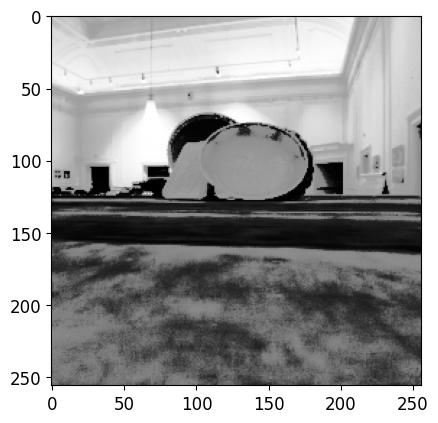

In [ ]:
plt.imshow(df['Equalized Grayscale'][0],cmap='gray')

🛑performing temporal filtering on a sequence of grayscale images in a DataFrame's 'Grayscale' column using a uniform filter. The filtered image sequences are stored in a new 'Temporal Filtering' column for further analysis or visualization.we can adjust the num_frames_to_average parameter based on our application's requirements.

In [ ]:
from scipy.ndimage import uniform_filter1d

# Define the number of frames to average over
num_frames_to_average = 3  # Adjust as needed based on your application

# Assuming 'Grayscale' column contains grayscale images as NumPy arrays in your DataFrame
# Assuming df is your DataFrame

# Function to apply temporal filtering to a grayscale image sequence
def apply_temporal_filter(image_sequence):
    filtered_images = []
    for i in range(len(image_sequence) - num_frames_to_average + 1):
        # Extract frames to average over
        frames_to_average = image_sequence[i:i + num_frames_to_average]

        # Stack frames along a new axis to create a 3D array
        stacked_frames = np.stack(frames_to_average, axis=0)

        # Compute temporal average using uniform_filter1d for 1D filtering
        averaged_frame = uniform_filter1d(stacked_frames, size=num_frames_to_average, axis=0, mode='constant')

        # Append the filtered frame to the result list
        filtered_images.append(averaged_frame[num_frames_to_average // 2])  # Get the middle frame after filtering

    return filtered_images

# Apply temporal filtering to the 'Grayscale' column
df['Temporal Filtering'] = df['Grayscale'].apply(apply_temporal_filter)

# 'Temporal Filtering' column now contains the filtered image sequences


In [ ]:
# df.head()

In [ ]:
df['Images'][0]

array([[[238, 200, 175],
        [235, 199, 171],
        [234, 199, 169],
        ...,
        [229, 202, 173],
        [229, 202, 173],
        [229, 202, 172]],

       [[241, 200, 180],
        [241, 201, 179],
        [237, 201, 174],
        ...,
        [229, 203, 175],
        [229, 202, 173],
        [228, 202, 171]],

       [[237, 198, 172],
        [241, 200, 178],
        [240, 201, 179],
        ...,
        [230, 204, 176],
        [229, 202, 173],
        [230, 203, 173]],

       ...,

       [[216, 104,  59],
        [216, 105,  59],
        [216, 105,  59],
        ...,
        [214, 102,  56],
        [214, 101,  56],
        [214, 102,  56]],

       [[215, 104,  59],
        [215, 104,  59],
        [215, 105,  59],
        ...,
        [214, 101,  56],
        [214, 101,  56],
        [215, 104,  58]],

       [[214, 103,  57],
        [215, 104,  59],
        [215, 104,  58],
        ...,
        [214, 101,  55],
        [215, 102,  57],
        [214, 102,  56]]

In [ ]:
df

,Images,labels,Grayscale,Equalized Grayscale,Temporal Filtering
0,"[[[238, 200, 175], [235, 199, 171], [234, 199,...","[[[0], [0], [0], [0], [0], [0], [0], [0], [0],...","[[0.8089117647058823, 0.8024752941176471, 0.80...","[[0.7872960535976057, 0.7639553361382934, 0.75...","[[0.8077854901960785, 0.810027843137255, 0.808..."
1,"[[[238, 200, 175], [235, 199, 171], [234, 199,...","[[[0], [0], [0], [0], [0], [0], [0], [0], [0],...","[[0.8089117647058823, 0.8024752941176471, 0.80...","[[0.7852301221752482, 0.7613600762894482, 0.75...","[[0.8077854901960785, 0.810027843137255, 0.808..."
2,"[[[238, 200, 175], [235, 199, 171], [234, 199,...","[[[0], [0], [0], [0], [0], [0], [0], [0], [0],...","[[0.8089117647058823, 0.8024752941176471, 0.80...","[[0.7856814732516814, 0.7627992778989416, 0.75...","[[0.8077854901960785, 0.810027843137255, 0.808..."
3,"[[[238, 200, 175], [235, 199, 171], [234, 199,...","[[[0], [0], [0], [0], [0], [0], [0], [0], [0],...","[[0.8089117647058823, 0.8024752941176471, 0.80...","[[0.7852705106583491, 0.7615878404913883, 0.75...","[[0.8077854901960785, 0.810027843137255, 0.808..."
4,"[[[238, 200, 175], [235, 199, 171], [234, 199,...","[[[0], [0], [0], [0], [0], [0], [0], [0], [0],...","[[0.8089117647058823, 0.8024752941176471, 0.80...","[[0.7831399198845674, 0.7595865552013545, 0.75...","[[0.8077854901960785, 0.810027843137255, 0.808..."
...,...,...,...,...,...
2155,"[[[180, 75, 46], [174, 73, 47], [165, 68, 43],...","[[[0], [0], [0], [0], [0], [0], [0], [0], [0],...","[[0.3734180392156863, 0.3630898039215686, 0.34...","[[0.23159460815013871, 0.13846203648122477, 0....","[[0.3705133333333333, 0.36044535947712414, 0.3..."
2156,"[[[194, 87, 54], [193, 86, 54], [193, 84, 53],...","[[[0], [0], [0], [0], [0], [0], [0], [0], [0],...","[[0.42101254901960783, 0.4173737254901961, 0.4...","[[0.7108059585236808, 0.6702173608464206, 0.61...","[[0.4172745098039215, 0.41232849673202615, 0.4..."
2157,"[[[194, 89, 51], [194, 89, 51], [194, 89, 51],...","[[[0], [0], [0], [0], [0], [0], [0], [0], [0],...","[[0.42577529411764703, 0.42577529411764703, 0....","[[0.7623414218759951, 0.7623414218759951, 0.76...","[[0.4224142483660131, 0.42353790849673195, 0.4..."
2158,"[[[188, 84, 49], [188, 85, 49], [191, 87, 51],...","[[[0], [0], [0], [0], [0], [0], [0], [0], [0],...","[[0.40618235294117644, 0.4089878431372549, 0.4...","[[0.5593325557709999, 0.5849132175454066, 0.66...","[[0.40879176470588235, 0.4122470588235294, 0.4..."


## **<font color="PINK">Training </font>** 🏃

🛑identifying our feature in x and our label in y

In [ ]:
x=df['Equalized Grayscale']
y=df['labels']

🛑For our model we tried to use different CNN Models
here we used in the begining U-net model, deeplav and segnet and we tried to improve it be changing its layers
These models especially U-Net model may not have performed well for background subtraction due to several reasons. Firstly, the model architecture might not have been complex enough to capture the intricate details of background variations in the given dataset. Additionally, insufficient or ineffective training, including issues with hyperparameter tuning or optimization, could have hindered the model's ability to learn and generalize effectively for background subtraction tasks. Experimenting with different model architectures, tuning hyperparameters, and ensuring a diverse and representative dataset could potentially address these challenges and enhance the model's performance in background subtraction.



## **<font color="PINK">U-net like CNN model </font>**


In [ ]:
# import tensorflow as tf
# from sklearn.model_selection import train_test_split
# import numpy as np
# import pandas as pd
# import tensorflow as tf
# from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D


# # Assuming x and y are your DataFrame columns
# # Replace 'Equalized Grayscale' and 'Ground truth' with the actual column names
# x = np.array(df['Equalized Grayscale'].tolist())
# y = np.array(df['labels'].tolist())

# # Convert data types
# x = x.astype('float32')
# y = y.astype('float32')

# # Reshape ground truth labels
# y_reshaped = y.reshape((len(y), 256, 256, 1))

# # Train-test split
# x_train, x_test, y_train, y_test = train_test_split(x, y_reshaped, test_size=0.2, random_state=42)

# # Assuming x_train and y_train are your training data and labels
# # Assuming x_train has shape (number_of_samples, 256, 256, 1) and y_train has shape (number_of_samples, 256, 256, 1)

# # Resize y_train to match the model's output shape
# y_train_resized = tf.image.resize(y_train, (236, 236))

# # Define the CNN model with cropping layer
# model = tf.keras.Sequential([
#     tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 1)),
#     tf.keras.layers.MaxPooling2D((2, 2)),
#     tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
#     tf.keras.layers.MaxPooling2D((2, 2)),
#     tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
#     tf.keras.layers.UpSampling2D((2, 2)),
#     tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
#     tf.keras.layers.UpSampling2D((2, 2)),
#     tf.keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')
# ])

# # Compile the model
# model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# # Train the model
# model.fit(x_train, y_train_resized, epochs=10, batch_size=32, validation_split=0.2)



In [ ]:
# # Resize y_test to match the model's output shape
# y_test_resized = tf.image.resize(y_test, (236, 236))

# # Evaluate the model on the resized test set
# evaluation_result = model.evaluate(x_test, y_test_resized)

# # Print the evaluation result
# print(f"Loss: {evaluation_result[0]}")
# print(f"Accuracy: {evaluation_result[1]}")


## **<font color="PINK">Improved U-Net like CNN model </font>**

In [ ]:
# import tensorflow as tf
# from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate

# def high_accuracy_unet_model(input_shape=(256, 256, 1)):
#     inputs = Input(shape=input_shape)

#     # Contracting Path
#     conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
#     conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
#     pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

#     # Expansive Path
#     up2 = UpSampling2D(size=(2, 2))(pool1)
#     up2 = Conv2D(64, 2, activation='relu', padding='same')(up2)
#     merge2 = Concatenate()([conv1, up2])
#     conv2 = Conv2D(64, 3, activation='relu', padding='same')(merge2)
#     conv2 = Conv2D(64, 3, activation='relu', padding='same')(conv2)

#     # Output layer
#     output = Conv2D(1, 1, activation='sigmoid')(conv2)

#     model = tf.keras.Model(inputs=inputs, outputs=output)
#     return model

# # Create the high-accuracy U-Net model
# high_accuracy_model = high_accuracy_unet_model()

# # Compile the model with a lower learning rate
# optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
# high_accuracy_model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# # Display the model summary
# high_accuracy_model.summary()

# # Train the high-accuracy model
# high_accuracy_model.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.2)


In [ ]:
# # Assuming x_test and y_test are your test data and labels
# # Assuming x_test has shape (number_of_samples, 256, 256, 1) and y_test has shape (number_of_samples, 256, 256, 1)

# # Resize y_test to match the model's output shape
# y_test_resized = tf.image.resize(y_test, (256, 256))

# # Evaluate the model on the resized test set
# evaluation_result = high_accuracy_model.evaluate(x_test, y_test_resized)

# # Print the evaluation result
# print(f"Loss: {evaluation_result[0]}")
# print(f"Accuracy: {evaluation_result[1]}")



## **<font color="PINK">applying different forms of U_net </font>**

In [ ]:
# import numpy as np
# import os
# import skimage.io as io
# import skimage.transform as trans
# import numpy as np
# from keras.models import *
# from keras.layers import *
# from keras.optimizers import *
# from keras.callbacks import ModelCheckpoint, LearningRateScheduler
# from keras import backend as keras

In [ ]:
# import os
# import tensorflow as tf
# import tensorflow_datasets as tfds

# # For some reason we seem to need to load tf onto the GPU first
# dummy = tf.constant( 32 )
# print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

In [ ]:
# def unet(pretrained_weights = None,input_size = (256,256,1)):
#     inputs = Input(input_size)
#     conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
#     conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
#     pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
#     conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
#     conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
#     pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
#     conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
#     conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
#     pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
#     conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
#     conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
#     drop4 = Dropout(0.5)(conv4)
#     pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

#     conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
#     conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
#     drop5 = Dropout(0.5)(conv5)

#     up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(drop5))
#     merge6 = concatenate([drop4,up6], axis = 3)
#     conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
#     conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

#     up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
#     merge7 = concatenate([conv3,up7], axis = 3)
#     conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
#     conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

#     up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
#     merge8 = concatenate([conv2,up8], axis = 3)
#     conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
#     conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

#     up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
#     merge9 = concatenate([conv1,up9], axis = 3)
#     conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
#     conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
#     conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
#     conv10 = Conv2D(1, 1, activation = 'sigmoid')(conv9)
#     model = Model(inputs=inputs, outputs=conv10)
#     model.compile(optimizer=Adam(lr=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

#     if pretrained_weights:
#         model.load_weights(pretrained_weights)


#     return model



In [ ]:
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout
# from tensorflow.keras.optimizers import Adam

# def unet(pretrained_weights=None, input_size=(256, 256, 1)):
#     inputs = Input(input_size)

#     conv1 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
#     conv1 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
#     pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

#     conv2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
#     conv2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
#     pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

#     conv3 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
#     conv3 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
#     pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

#     conv4 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
#     conv4 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)
#     drop4 = Dropout(0.5)(conv4)
#     pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

#     conv5 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool4)
#     conv5 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)
#     drop5 = Dropout(0.5)(conv5)

#     up6 = Conv2D(256, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(drop5))
#     merge6 = concatenate([drop4, up6], axis=3)
#     conv6 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge6)
#     conv6 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)

#     up7 = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv6))
#     merge7 = concatenate([conv3, up7], axis=3)
#     conv7 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
#     conv7 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)

#     up8 = Conv2D(64, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv7))
#     merge8 = concatenate([conv2, up8], axis=3)
#     conv8 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge8)
#     conv8 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)

#     up9 = Conv2D(32, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv8))
#     merge9 = concatenate([conv1, up9], axis=3)
#     conv9 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge9)
#     conv9 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv9)

#     conv10 = Conv2D(1, 1, activation='sigmoid')(conv9)

#     model = Model(inputs=inputs, outputs=conv10)
#     model.compile(optimizer=Adam(lr=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

#     if pretrained_weights:
#         model.load_weights(pretrained_weights)

#     return model

In [ ]:
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout
# from tensorflow.keras.optimizers import Adam

# def unet(pretrained_weights=None, input_size=(256, 256, 1)):
#     inputs = Input(input_size)

#     conv1 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
#     conv1 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
#     pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

#     conv2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
#     conv2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
#     pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

#     conv3 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
#     conv3 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
#     pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

#     conv4 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
#     conv4 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)
#     drop4 = Dropout(0.5)(conv4)

#     up5 = UpSampling2D(size=(2, 2))(drop4)
#     up5 = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer='he_normal')(up5)
#     merge5 = concatenate([conv3, up5], axis=3)
#     conv5 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge5)
#     conv5 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)

#     up6 = UpSampling2D(size=(2, 2))(conv5)
#     up6 = Conv2D(64, 2, activation='relu', padding='same', kernel_initializer='he_normal')(up6)
#     merge6 = concatenate([conv2, up6], axis=3)
#     conv6 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge6)
#     conv6 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)

#     up7 = UpSampling2D(size=(2, 2))(conv6)
#     up7 = Conv2D(32, 2, activation='relu', padding='same', kernel_initializer='he_normal')(up7)
#     merge7 = concatenate([conv1, up7], axis=3)
#     conv7 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
#     conv7 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)

#     conv8 = Conv2D(1, 1, activation='sigmoid')(conv7)

#     model = Model(inputs=inputs, outputs=conv8)
#     model.compile(optimizer=Adam(lr=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

#     if pretrained_weights:
#         model.load_weights(pretrained_weights)

#     return model


In [ ]:
# model=unet()

In [ ]:
# model.summary()

In [ ]:
# tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
# history=model.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

In [ ]:
# from sklearn.metrics import accuracy_score
# from sklearn.metrics import classification_report, confusion_matrix

# Y_pred = np.argmax(model.predict(x_test),axis=1)
# print('Confusion Matrix')
# cm3=confusion_matrix(y_test, Y_pred)
# print(cm3)
# plot_cm(cm3,"Confusion matrix (testing)")

# # print('Classification Report')
# # target_names = ['Cleavers', 'Common_Chickweed', 'Maize', 'Shepherds_Purse']
# # print(classification_report(y_test, Y_pred, target_names=target_names))


# # accuracy_test_c = accuracy_score(y_test, Y_pred)
# # print("Accuracy: {:.2f}".format(accuracy_test_c))

## **<font color="PINK">Using DeepLabV3 </font>**

In [ ]:

# import matplotlib.pyplot as plt

# k = ''
# if 'accuracy' in history.history :
#     k = 'accuracy'

# if 'acc' in history.history :
#     k = 'acc'

# if k != '' :
#     plt.plot(history.history[k])
#     plt.plot(history.history['val_'+k])
#     plt.title('Model Accuracy')
#     plt.ylabel('Accuracy')
#     plt.xlabel('Epoch')
#     plt.legend(['train', 'val'], loc='upper left')
#     plt.show()


In [111]:
# from tensorflow.keras.applications import DeepLabV3, UNet, MobileNetV2
# from tensorflow.keras.layers import Input

# # Example using DeepLabV3
# base_model = DeepLabV3(weights='imagenet', include_top=False, input_tensor=Input(shape=(None, None, 3)))

# # Modify the architecture as needed (add a decoder for U-Net, etc.)

# # Compile the model and train it on your dataset
# # model.compile(optimizer='adam', loss='your_loss_function', metrics=['accuracy'])
# # model.fit(train_images, train_masks, epochs=...)

# # Save the trained model for later use
# # model.save('your_segmentation_model.h5')



## **<font color="PINK">Segnet </font>**

In [112]:
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, UpSampling2D, Concatenate
# from tensorflow.keras.applications import MobileNetV2
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.losses import SparseCategoricalCrossentropy

# def build_segnet(input_shape=(128, 128, 3), num_classes=2):
#     # Encoder (based on MobileNetV2)
#     base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')
#     encoder_output = base_model.output

#     # Decoder
#     x = UpSampling2D()(encoder_output)
#     x = Conv2D(256, (3, 3), padding='same')(x)
#     x = BatchNormalization()(x)
#     x = Activation('relu')(x)

#     x = UpSampling2D()(x)
#     x = Conv2D(128, (3, 3), padding='same')(x)
#     x = BatchNormalization()(x)
#     x = Activation('relu')(x)

#     x = UpSampling2D()(x)
#     x = Conv2D(64, (3, 3), padding='same')(x)
#     x = BatchNormalization()(x)
#     x = Activation('relu')(x)

#     x = UpSampling2D()(x)
#     x = Conv2D(32, (3, 3), padding='same')(x)
#     x = BatchNormalization()(x)
#     x = Activation('relu')(x)

#     # Output layer
#     outputs = Conv2D(num_classes, (1, 1), activation='softmax')(x)

#     # Create the model
#     model = Model(inputs=base_model.input, outputs=outputs)

#     return model

# # Instantiate the SegNet model
# segnet_model = build_segnet()

# # Compile the model
# segnet_model.compile(optimizer=Adam(learning_rate=1e-4), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

# # Display the model summary
# segnet_model.summary()


## **<font color="#FFDDC1">Training with yolo </font>**

🛑we used up_to date model YOLO which is well known object detection and segmentation algorithm. It is known for its accuracy and speed, making it a popular choice for real-time applications

first, we are going to split the data into train, validation and testing

In [ ]:
images = df['Images']
labels = df['labels']

In [ ]:
from sklearn.model_selection import train_test_split

# Train-test split
x_train, x_test, y_train, y_test = train_test_split(images,  labels,  test_size=0.2, random_state=42)
x_train, x_val,  y_train, y_val  = train_test_split(x_train, y_train, test_size=0.2, random_state=42)



## **<font color="#FFDDC1">YOLO v8 model </font>**


🛑
**Setup data directories for YOLO8**

It organizes folders for training, validation, and test data, with subdirectories for images and labels within each split. This structured setup is essential for managing and processing data efficiently in the context of background subtraction model training and evaluation.

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np

# Specify the root directory in Google Drive
root_dir = r'C:\Users\aa\Desktop\background'

# Create the root directory if it doesn't exist
if not os.path.exists(root_dir):
    os.makedirs(root_dir)

# Create subdirectories inside the root directory
subdirectories = ['data', 'masks', 'test_data']

for subdir in subdirectories:
    # Create subdirectory if it doesn't exist
    subdir_path = os.path.join(root_dir, subdir)
    if not os.path.exists(subdir_path):
        os.makedirs(subdir_path)


# Create the data directory if it doesn't exist
if not os.path.exists(os.path.join(root_dir, 'data')):
    os.makedirs(os.path.join(root_dir, 'data'))

# Create subdirectories inside the root directory
sub_data = ['images/train', 'images/val', 'labels/train', 'labels/val']

for subdir in sub_data:
    # Create subdirectory if it doesn't exist
    subdir_path = os.path.join(os.path.join(root_dir, 'data'), subdir)
    if not os.path.exists(subdir_path):
        os.makedirs(subdir_path)

# Create the masks directory if it doesn't exist
if not os.path.exists(os.path.join(root_dir, 'masks')):
    os.makedirs(os.path.join(root_dir, 'masks'))

# Create subdirectories inside the root directory
sub_masks_data = ['train', 'val', 'test']

for subdir in sub_masks_data:
    # Create subdirectory if it doesn't exist
    subdir_path = os.path.join(os.path.join(root_dir, 'masks'), subdir)
    if not os.path.exists(subdir_path):
        os.makedirs(subdir_path)


# Create the test data if it doesn't exist
if not os.path.exists(os.path.join(root_dir, 'test_data')):
    os.makedirs(os.path.join(root_dir, 'test_data'))

# Create subdirectories inside the root directory
sub_test_data = ['images', 'labels']

for subdir in sub_test_data:
    # Create subdirectory if it doesn't exist
    subdir_path = os.path.join(os.path.join(root_dir, 'test_data'), subdir)
    if not os.path.exists(subdir_path):
        os.makedirs(subdir_path)





## **<font color="PINK">Store data in folders </font>**

This code segment is part of the data preparation process for training a YOLO8 model for background subtraction. It creates and saves PNG images derived from the given NumPy arrays (x_train, x_val, x_test) in distinct directories (data/images/train, data/images/val, test_data/images) under the specified root directory (C:\Users\aa\Desktop\background). These images serve as essential input data for the YOLO8 model, facilitating its training, validation, and testing phases within the broader background subtraction project.

In [ ]:
root_dir=r'C:\Users\aa\Desktop\background'

In [ ]:
# Prepare training data for YOLO8
# Specify the desired directory

# PROJECT_ROOT_DIR = '/content/drive/MyDrive/elg7186_projectdata/data/images'
# output_directory = os.path.join(PROJECT_ROOT_DIR, 'train')
output_directory = os.path.join(root_dir, 'data/images/train')

# Create the directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
    print(f"Directory '{output_directory}' created.")

# Generate and save multiple images in a for loop
for index, value in enumerate(x_train):

    # Construct the unique file name based on the index
    output_filename = f'image_{index}.png'

    # Save the NumPy array as an image in the desired directory
    output_path = os.path.join(output_directory, output_filename)
    plt.imsave(output_path, value.astype(np.uint8))

    # Display the saved image path
    print(f"Image {index} saved at: {output_path}")


Image 0 saved at: C:\Users\aa\Desktop\background\data/images/train\image_0.png
Image 1 saved at: C:\Users\aa\Desktop\background\data/images/train\image_1.png
Image 2 saved at: C:\Users\aa\Desktop\background\data/images/train\image_2.png
Image 3 saved at: C:\Users\aa\Desktop\background\data/images/train\image_3.png
Image 4 saved at: C:\Users\aa\Desktop\background\data/images/train\image_4.png
Image 5 saved at: C:\Users\aa\Desktop\background\data/images/train\image_5.png
Image 6 saved at: C:\Users\aa\Desktop\background\data/images/train\image_6.png
Image 7 saved at: C:\Users\aa\Desktop\background\data/images/train\image_7.png
Image 8 saved at: C:\Users\aa\Desktop\background\data/images/train\image_8.png
Image 9 saved at: C:\Users\aa\Desktop\background\data/images/train\image_9.png
Image 10 saved at: C:\Users\aa\Desktop\background\data/images/train\image_10.png
Image 11 saved at: C:\Users\aa\Desktop\background\data/images/train\image_11.png
Image 12 saved at: C:\Users\aa\Desktop\backgroun

In [ ]:
# Prepare validation data for YOLO8
# Specify the desired directory

# PROJECT_ROOT_DIR = '/content/drive/MyDrive/elg7186_projectdata/data/images'
# output_directory = os.path.join(PROJECT_ROOT_DIR, 'val')
output_directory = os.path.join(root_dir, 'data/images/val')

# Create the directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
    print(f"Directory '{output_directory}' created.")

# Generate and save multiple images in a for loop
for index, value in enumerate(x_val):

    # Construct the unique file name based on the index
    output_filename = f'image_{index}.png'

    # Save the NumPy array as an image in the desired directory
    output_path = os.path.join(output_directory, output_filename)
    plt.imsave(output_path, value.astype(np.uint8))

    # Display the saved image path
    print(f"Image {index} saved at: {output_path}")


Directory 'C:\Users\aa\Desktop\background\data/images/val' created.
Image 0 saved at: C:\Users\aa\Desktop\background\data/images/val\image_0.png
Image 1 saved at: C:\Users\aa\Desktop\background\data/images/val\image_1.png
Image 2 saved at: C:\Users\aa\Desktop\background\data/images/val\image_2.png
Image 3 saved at: C:\Users\aa\Desktop\background\data/images/val\image_3.png
Image 4 saved at: C:\Users\aa\Desktop\background\data/images/val\image_4.png
Image 5 saved at: C:\Users\aa\Desktop\background\data/images/val\image_5.png
Image 6 saved at: C:\Users\aa\Desktop\background\data/images/val\image_6.png
Image 7 saved at: C:\Users\aa\Desktop\background\data/images/val\image_7.png
Image 8 saved at: C:\Users\aa\Desktop\background\data/images/val\image_8.png
Image 9 saved at: C:\Users\aa\Desktop\background\data/images/val\image_9.png
Image 10 saved at: C:\Users\aa\Desktop\background\data/images/val\image_10.png
Image 11 saved at: C:\Users\aa\Desktop\background\data/images/val\image_11.png
Imag

In [ ]:
# Prepare testing data for YOLO8
# Specify the desired directory

# PROJECT_ROOT_DIR = '/content/drive/MyDrive/test_data'
# output_directory = os.path.join(PROJECT_ROOT_DIR, 'images')
output_directory = os.path.join(root_dir, 'test_data/images')

# Create the directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
    print(f"Directory '{output_directory}' created.")

# Generate and save multiple images in a for loop
for index, value in enumerate(x_test):

    # Construct the unique file name based on the index
    output_filename = f'image_{index}.png'

    # Save the NumPy array as an image in the desired directory
    output_path = os.path.join(output_directory, output_filename)
    plt.imsave(output_path, value.astype(np.uint8))

    # Display the saved image path
    print(f"Image {index} saved at: {output_path}")


Image 0 saved at: C:\Users\aa\Desktop\background\test_data/images\image_0.png
Image 1 saved at: C:\Users\aa\Desktop\background\test_data/images\image_1.png
Image 2 saved at: C:\Users\aa\Desktop\background\test_data/images\image_2.png
Image 3 saved at: C:\Users\aa\Desktop\background\test_data/images\image_3.png
Image 4 saved at: C:\Users\aa\Desktop\background\test_data/images\image_4.png
Image 5 saved at: C:\Users\aa\Desktop\background\test_data/images\image_5.png
Image 6 saved at: C:\Users\aa\Desktop\background\test_data/images\image_6.png
Image 7 saved at: C:\Users\aa\Desktop\background\test_data/images\image_7.png
Image 8 saved at: C:\Users\aa\Desktop\background\test_data/images\image_8.png
Image 9 saved at: C:\Users\aa\Desktop\background\test_data/images\image_9.png
Image 10 saved at: C:\Users\aa\Desktop\background\test_data/images\image_10.png
Image 11 saved at: C:\Users\aa\Desktop\background\test_data/images\image_11.png
Image 12 saved at: C:\Users\aa\Desktop\background\test_data/


## **<font color="PINK">Prepare Masks in folders </font>**

The following code section is dedicated to preparing training, validation, and testing masks for YOLO8 in the context of the background subtraction project. It generates grayscale PNG images from the provided NumPy arrays (y_train, y_val, y_test) and saves them in distinct directories (masks/train, masks/val, masks/test) under the specified root directory (C:\Users\aa\Desktop\background). These masks are crucial for guiding the YOLO8 model during its training, validation, and testing phases, enabling accurate background subtraction in the subsequent stages of the project


In [ ]:
# Prepare training masks for YOLO8
# Specify the desired directory

# PROJECT_ROOT_DIR = '/content/drive/MyDrive/elg7186_projectdata/'
# output_directory = os.path.join(PROJECT_ROOT_DIR, 'Masks/train')
output_directory = os.path.join(root_dir, 'masks/train')

# Create the directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
    print(f"Directory '{output_directory}' created.")

# Generate and save multiple images in a for loop
for index, value in enumerate(y_train):
    # Construct the unique file name based on the index
    output_filename = f'image_{index}.png'

    # Save the NumPy array as an image in the desired directory
    output_path = os.path.join(output_directory, output_filename)
    plt.imsave(output_path, np.squeeze(value).astype(np.uint8), cmap='gray')


    # Display the saved image path
    print(f"Image {index} saved at: {output_path}")


Image 0 saved at: C:\Users\aa\Desktop\background\masks/train\image_0.png
Image 1 saved at: C:\Users\aa\Desktop\background\masks/train\image_1.png
Image 2 saved at: C:\Users\aa\Desktop\background\masks/train\image_2.png
Image 3 saved at: C:\Users\aa\Desktop\background\masks/train\image_3.png
Image 4 saved at: C:\Users\aa\Desktop\background\masks/train\image_4.png
Image 5 saved at: C:\Users\aa\Desktop\background\masks/train\image_5.png
Image 6 saved at: C:\Users\aa\Desktop\background\masks/train\image_6.png
Image 7 saved at: C:\Users\aa\Desktop\background\masks/train\image_7.png
Image 8 saved at: C:\Users\aa\Desktop\background\masks/train\image_8.png
Image 9 saved at: C:\Users\aa\Desktop\background\masks/train\image_9.png
Image 10 saved at: C:\Users\aa\Desktop\background\masks/train\image_10.png
Image 11 saved at: C:\Users\aa\Desktop\background\masks/train\image_11.png
Image 12 saved at: C:\Users\aa\Desktop\background\masks/train\image_12.png
Image 13 saved at: C:\Users\aa\Desktop\backgr

In [ ]:
# Specify the desired directory

# PROJECT_ROOT_DIR = '/content/drive/MyDrive/elg7186_projectdata/'
# output_directory = os.path.join(PROJECT_ROOT_DIR, 'Masks/val')
output_directory = os.path.join(root_dir, 'masks/val')

# Create the directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
    print(f"Directory '{output_directory}' created.")

# Generate and save multiple images in a for loop
for index, value in enumerate(y_val):

    # Construct the unique file name based on the index
    output_filename = f'image_{index}.png'

    # Save the NumPy array as an image in the desired directory
    output_path = os.path.join(output_directory, output_filename)
    plt.imsave(output_path, np.squeeze(value).astype(np.uint8), cmap='gray')


    # Display the saved image path
    print(f"Image {index} saved at: {output_path}")


Image 0 saved at: C:\Users\aa\Desktop\background\masks/val\image_0.png
Image 1 saved at: C:\Users\aa\Desktop\background\masks/val\image_1.png
Image 2 saved at: C:\Users\aa\Desktop\background\masks/val\image_2.png
Image 3 saved at: C:\Users\aa\Desktop\background\masks/val\image_3.png
Image 4 saved at: C:\Users\aa\Desktop\background\masks/val\image_4.png
Image 5 saved at: C:\Users\aa\Desktop\background\masks/val\image_5.png
Image 6 saved at: C:\Users\aa\Desktop\background\masks/val\image_6.png
Image 7 saved at: C:\Users\aa\Desktop\background\masks/val\image_7.png
Image 8 saved at: C:\Users\aa\Desktop\background\masks/val\image_8.png
Image 9 saved at: C:\Users\aa\Desktop\background\masks/val\image_9.png
Image 10 saved at: C:\Users\aa\Desktop\background\masks/val\image_10.png
Image 11 saved at: C:\Users\aa\Desktop\background\masks/val\image_11.png
Image 12 saved at: C:\Users\aa\Desktop\background\masks/val\image_12.png
Image 13 saved at: C:\Users\aa\Desktop\background\masks/val\image_13.pn

In [ ]:
# Specify the desired directory

# PROJECT_ROOT_DIR = '/content/drive/MyDrive/elg7186_projectdata/'
# output_directory = os.path.join(PROJECT_ROOT_DIR, 'Masks/val')
output_directory = os.path.join(root_dir, 'masks/test')

# Create the directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
    print(f"Directory '{output_directory}' created.")

# Generate and save multiple images in a for loop
for index, value in enumerate(y_test):

    # Construct the unique file name based on the index
    output_filename = f'image_{index}.png'

    # Save the NumPy array as an image in the desired directory
    output_path = os.path.join(output_directory, output_filename)
    plt.imsave(output_path, np.squeeze(value).astype(np.uint8), cmap='gray')


    # Display the saved image path
    print(f"Image {index} saved at: {output_path}")


Image 0 saved at: C:\Users\aa\Desktop\background\masks/test\image_0.png
Image 1 saved at: C:\Users\aa\Desktop\background\masks/test\image_1.png
Image 2 saved at: C:\Users\aa\Desktop\background\masks/test\image_2.png
Image 3 saved at: C:\Users\aa\Desktop\background\masks/test\image_3.png
Image 4 saved at: C:\Users\aa\Desktop\background\masks/test\image_4.png
Image 5 saved at: C:\Users\aa\Desktop\background\masks/test\image_5.png
Image 6 saved at: C:\Users\aa\Desktop\background\masks/test\image_6.png
Image 7 saved at: C:\Users\aa\Desktop\background\masks/test\image_7.png
Image 8 saved at: C:\Users\aa\Desktop\background\masks/test\image_8.png
Image 9 saved at: C:\Users\aa\Desktop\background\masks/test\image_9.png
Image 10 saved at: C:\Users\aa\Desktop\background\masks/test\image_10.png
Image 11 saved at: C:\Users\aa\Desktop\background\masks/test\image_11.png
Image 12 saved at: C:\Users\aa\Desktop\background\masks/test\image_12.png
Image 13 saved at: C:\Users\aa\Desktop\background\masks/te

## **<font color="FFDDC1">Convert masks to labels that yolo8 understands </font>**

In below code segment, the binary masks generated for the YOLO8 model in the background subtraction project are processed to create labeled data for training and evaluation. The process involves loading each binary mask image from the test, validation, and training sets, extracting contours, and converting them into polygons. These polygons, representing distinct regions in the masks, are then saved as text files (.txt) in their respective 'labels' directories ('test_data/labels', 'data/labels/val', 'data/labels/train'). The text files contain normalized coordinates of the polygons, making them compatible with the input format required by YOLO8. This step is crucial for training the YOLO8 model to accurately detect and segment objects in images, contributing to the success of the overall background subtraction task in the project

In [ ]:
import os
import cv2

input_dir = os.path.join(root_dir, 'masks/test')
output_dir = os.path.join(root_dir, 'test_data/labels')

for j in os.listdir(input_dir):
    image_path = os.path.join(input_dir, j)
    # load the binary mask and get its contours
    mask = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    _, mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)

    H, W = mask.shape
    contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # convert the contours to polygons
    polygons = []
    for cnt in contours:
        if cv2.contourArea(cnt) > 200:
            polygon = []
            for point in cnt:
                x, y = point[0]
                polygon.append(x / W)
                polygon.append(y / H)
            polygons.append(polygon)

    # print the polygons
    with open('{}.txt'.format(os.path.join(output_dir, j)[:-4]), 'w') as f:
        for polygon in polygons:
            for p_, p in enumerate(polygon):
                if p_ == len(polygon) - 1:
                    f.write('{}\n'.format(p))
                elif p_ == 0:
                    f.write('0 {} '.format(p))
                else:
                    f.write('{} '.format(p))

        f.close()

In [ ]:
import cv2

In [ ]:
input_dir = os.path.join(root_dir, 'masks/val')
output_dir = os.path.join(root_dir, 'data/labels/val')

for j in os.listdir(input_dir):
    image_path = os.path.join(input_dir, j)
    # load the binary mask and get its contours
    mask = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    _, mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)

    H, W = mask.shape
    contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # convert the contours to polygons
    polygons = []
    for cnt in contours:
        if cv2.contourArea(cnt) > 200:
            polygon = []
            for point in cnt:
                x, y = point[0]
                polygon.append(x / W)
                polygon.append(y / H)
            polygons.append(polygon)

    # print the polygons
    with open('{}.txt'.format(os.path.join(output_dir, j)[:-4]), 'w') as f:
        for polygon in polygons:
            for p_, p in enumerate(polygon):
                if p_ == len(polygon) - 1:
                    f.write('{}\n'.format(p))
                elif p_ == 0:
                    f.write('0 {} '.format(p))
                else:
                    f.write('{} '.format(p))

        f.close()

In [ ]:
input_dir = os.path.join(root_dir, 'masks\\train')
output_dir = os.path.join(root_dir, 'data\\labels\\train')

for j in os.listdir(input_dir):
    image_path = os.path.join(input_dir, j)
    # load the binary mask and get its contours
    mask = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    _, mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)

    H, W = mask.shape
    contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # convert the contours to polygons
    polygons = []
    for cnt in contours:
        if cv2.contourArea(cnt) > 200:
            polygon = []
            for point in cnt:
                x, y = point[0]
                polygon.append(x / W)
                polygon.append(y / H)
            polygons.append(polygon)

    # print the polygons
    with open('{}.txt'.format(os.path.join(output_dir, j)[:-4]), 'w') as f:
        for polygon in polygons:
            for p_, p in enumerate(polygon):
                if p_ == len(polygon) - 1:
                    f.write('{}\n'.format(p))
                elif p_ == 0:
                    f.write('0 {} '.format(p))
                else:
                    f.write('{} '.format(p))

        f.close()

## **<font color="PINK">Make yaml file </font>**

we made YAML file which is used to configure and organize data paths for your background subtraction project. The train, val, and test paths define where the respective datasets are located, and nc and names provide information about the classes involved, with 'foreground' being the sole class in this case. This configuration is crucial for setting up and running experiments with your background subtraction model.

In [ ]:
yaml_file_path

'/content/drive/MyDrive/YOLO8_data/config.yaml'

In [ ]:
import os
print(os.path.abspath('C:\\Users\\aa\\Desktop\\background\\data'))


C:\Users\aa\Desktop\background\data


🛑checks if a GPU (CUDA) is available for use with PyTorch. If the output is True, it means that your system has a compatible GPU, and PyTorch can leverage it for accelerated computations. If the output is False, it indicates that either there is no GPU on your system, or the GPU is not set up for PyTorch.

In [ ]:
import torch

print(torch.cuda.is_available())

True


In [ ]:
import torch

device = torch.cuda.current_device()
print(f"Current CUDA device ID: {device}")


Current CUDA device ID: 0


In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')


In [ ]:
print(device)
torch.cuda.set_device(0)

cuda:0


🛑 the following cell is used for  It loops over different sets of hyperparameters, such as the number of epochs, learning rate, and batch size, to train the model multiple times with different configurations. The trained model is loaded from a pre-trained checkpoint ('yolov8n-seg.pt'), and the training is performed on either the GPU (cuda) if available or the CPU. The results, including accuracy values and metrics, are stored in lists for further analysis or visualization.
but because it crashes in several devices with and without GPU we divided it into several expreiments (18 experiments)

In [ ]:
import os

from ultralytics import YOLO

# Define the range of parameters to loop over
epochs_range = [10, 32, 40]
lr_range = [0.0001, 0.001, 0.01]
batch_range = [8, 12]

# Load the pretrained model
model = YOLO('yolov8n-seg.pt')

# Define the data path
data_path = '/home/luminatech/background/config.yaml'
# Initialize empty lists to store accuracy values
accuracy_values = []
epoch_values = []
all_metrics=[]
all_metrics2=[]
names=[]
# Loop over the parameters
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Move the model to the GPU
model.to(device)


# # Create a plot of accuracy vs. epoch
# plt.plot(epoch_values, accuracy_values)
# plt.xlabel('Epoch')
# plt.ylabel('Accuracy')
# plt.title('Accuracy of YOLO8 for Different Epoch Sizes')
# plt.show()

Using device: cuda


In [ ]:
#exp 1
epochs= epochs_range[0]
lr = lr_range[0]
bt = batch_range[0]
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res1' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))


Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=10, patience=50, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_100.00018, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format

In [ ]:
#exp2
epochs= epochs_range[1]
lr = lr_range[0]
bt = batch_range[0]
#, device=1
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res2' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))


Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=32, patience=50, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_320.00018, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format

In [ ]:
#exp 3
epochs= epochs_range[2]
lr = lr_range[0]
bt = batch_range[0]
#, device=1
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res3' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=40, patience=50, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_400.00018, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format

In [ ]:
#exp 4
epochs= epochs_range[0]
lr = lr_range[1]
bt = batch_range[0]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res4' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=10, patience=50, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_100.0018, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=

In [ ]:
#exp 5
epochs= epochs_range[1]
lr = lr_range[1]
bt = batch_range[0]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res5' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=32, patience=50, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_320.0018, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=

In [ ]:
#exp 6
epochs= epochs_range[2]
lr = lr_range[1]
bt = batch_range[0]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res6' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=40, patience=50, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_400.0018, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=

In [ ]:
#exp 7
epochs= epochs_range[0]
lr = lr_range[2]
bt = batch_range[0]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res7' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=10, patience=50, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_100.018, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=t

In [ ]:
#exp 8
epochs= epochs_range[1]
lr = lr_range[2]
bt = batch_range[0]
#, device=1
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res8' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=32, patience=50, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_320.018, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=t

In [ ]:
#exp 9
epochs= epochs_range[2]
lr = lr_range[2]
bt = batch_range[0]
#, device=1
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res9' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=40, patience=50, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_400.018, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=t

In [ ]:
#exp 10
epochs= epochs_range[0]
lr = lr_range[0]
bt = batch_range[1]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res9' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=10, patience=50, batch=12, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_100.000112, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, form

In [ ]:
#exp 11
epochs= epochs_range[1]
lr = lr_range[0]
bt = batch_range[1]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res10' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=32, patience=50, batch=12, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_320.000112, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, form

In [ ]:
#exp 12
epochs= epochs_range[2]
lr = lr_range[0]
bt = batch_range[1]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res12' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=40, patience=50, batch=12, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_400.000112, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, form

In [ ]:
#exp 13
epochs= epochs_range[0]
lr = lr_range[1]
bt = batch_range[1]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res13' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=10, patience=50, batch=12, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_100.00112, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, forma

In [ ]:
#exp 14
epochs= epochs_range[1]
lr = lr_range[1]
bt = batch_range[1]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res14' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=32, patience=50, batch=12, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_320.00112, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, forma

In [ ]:
#exp 15
epochs= epochs_range[2]
lr = lr_range[1]
bt = batch_range[1]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res15' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=40, patience=50, batch=12, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_400.00112, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, forma

In [ ]:
#exp 16
epochs= epochs_range[0]
lr = lr_range[2]
bt = batch_range[1]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res16' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=10, patience=50, batch=12, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_100.0112, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format

In [ ]:
#exp 17
epochs= epochs_range[1]
lr = lr_range[2]
bt = batch_range[1]
#, device=1
# Train the model with the current parameters
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res17' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=32, patience=50, batch=12, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_320.0112, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format

In [ ]:
#exp 18
epochs= epochs_range[2]
lr = lr_range[2]
bt = batch_range[1]
#, device=1
train_logs = model.train(data='/home/luminatech/background/config.yaml', epochs=epochs, imgsz=640, lr0=lr, batch=bt, project = '/home/luminatech/background/Results_runs/train_'+ str(epochs) + str(lr) + str(bt)   )
metrics = model.val(data='/home/luminatech/background/config.yaml', project = '/home/luminatech/background/Results_runs/test_'+ str(epochs) + str(lr) + str(bt))
all_metrics.append(metrics)


with open('/home/luminatech/background/Results_runs/res18' + str(epochs) + str(lr) + str(bt) +'.txt', 'w') as file:
    # Write the variable to the file
    file.write(str(metrics))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 7972MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.yaml, data=/home/luminatech/background/config.yaml, epochs=40, patience=50, batch=12, imgsz=640, save=True, cache=False, device=, workers=8, project=/home/luminatech/background/Results_runs/train_400.0112, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format

In [ ]:
metrics = model.val(data='/content/drive/MyDrive/YOLO8_data/config.yaml' ,split='test' , project = '/content/runs/runs2')

In [ ]:
!scp -r /content/runs '/content/drive/MyDrive/runs'

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

model_path = '/content/runs/segment/train2/weights/best.pt'
image_path = '/content/drive/MyDrive/elg7186_projectdata/data/images/val/image_0.png'

img = cv2.imread(image_path)
H, W, _ = img.shape

model = YOLO(model_path)

results = model(img)

# Plot the original image
plt.figure(figsize=(12, 4))
plt.subplot(1, len(results) + 1, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.show()

# Plot the predicted masks
for i, result in enumerate(results):
    for j, mask in enumerate(result.masks.data):
        mask = mask.numpy() * 255
        mask = cv2.resize(mask, (W, H))

        # Calculate the subplot index correctly
        subplot_index = len(results) * j + 1

        plt.subplot(1, len(results) + 1, subplot_index)
        plt.imshow(mask, cmap='gray')
        plt.title(f'Mask {j}')

plt.show()


In [ ]:
!find . -name 'yolov8*.yaml'




# **<font color="Orange">Plotting of results   </font>** 🖌

---

here we uploaded each of file results as csv
theses numbers indicates for

first <font color="yellow">**epochs**   </font>  then <font color="yellow">**learning_rate**   </font>  then <font color="yellow">**batch**   </font>

the csv files are a result of the running the  model but we downloaded in local manually for visualization

---

In [113]:
#10 0.0001 8
file1=pd.read_csv('/content/1.csv')
#10 0.001 8
file2=pd.read_csv('/content/2.csv')
#10 0.01 8
file3=pd.read_csv('/content/3.csv')
#10 0.0001 12
file4=pd.read_csv('/content/4.csv')
#10 0.001 12
file5=pd.read_csv('/content/5.csv')
#10 0.01 12
file6=pd.read_csv('/content/6.csv')
#32 0.0001 8
file7=pd.read_csv('/content/7.csv')
#32 0.001 8
file8=pd.read_csv('/content/8.csv')
#32 0.01 8
file9=pd.read_csv('/content/9.csv')
#32 0.0001 12
file10=pd.read_csv('/content/10.csv')
#32 0.001 12
file11=pd.read_csv('/content/11.csv')
#32 0.01 12
file12=pd.read_csv('/content/12.csv')
#40 0.0001 8
file13=pd.read_csv('/content/13.csv')
#40 0.001 8
file14=pd.read_csv('/content/14.csv')
#40 0.01 8
file15=pd.read_csv('/content/15.csv')
#40 0.0001 12
file16=pd.read_csv('/content/16.csv')
#40 0.001 12
file17=pd.read_csv('/content/17.csv')
#40 0.01 12
file18=pd.read_csv('/content/18.csv')

**<font color="lightblue">Segmentation loss for the number 10 epochs training </font>**

The best segmentation loss is 0.8 at epoch number 10 for the model with an initial learning rate of 0.0001 and a batch size of 12. This means that this model configuration is the best for reducing the separation loss on this particular image segmentation task

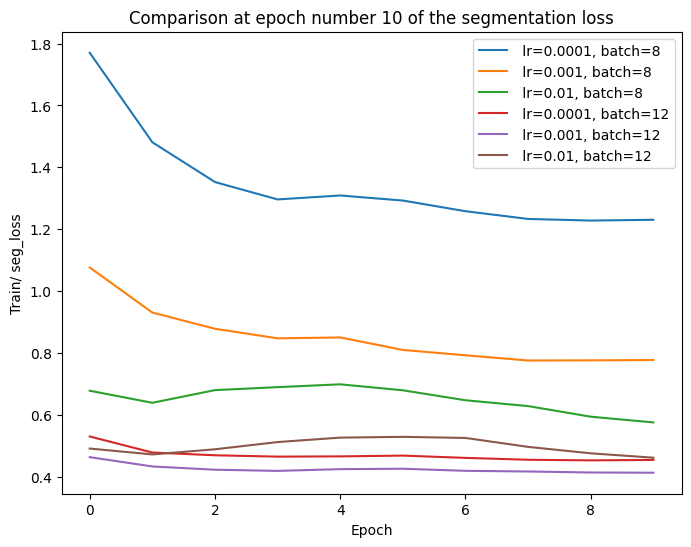

In [129]:
plt.figure(figsize=(8, 6))

for file_number in range(1, 7):

    file_data = globals()[f'file{file_number}']

    file_data.columns = file_data.columns.str.strip()

    x = file_data['epoch']
    y = file_data['train/seg_loss']

    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)

    if (file_number ) <= 3:
        third_number = 8
    else:
        third_number = 12

    label = f' lr={second_number}, batch={third_number}'

    plt.plot(x, y, label=label)

# Set labels and title
plt.xlabel('Epoch')
plt.ylabel('Train/ seg_loss')
plt.title('Comparison at epoch number 10 of the segmentation loss')

# Display legend
plt.legend()

# Show the plot
plt.show()




**<font color="lightblue">Segmentation loss for the number 10 epochs validating </font>**


The best result is a segmentation loss in validation of 0.8 at epoch number 10 for the model with an initial learning rate of 0.0001 and a batch size of 12.

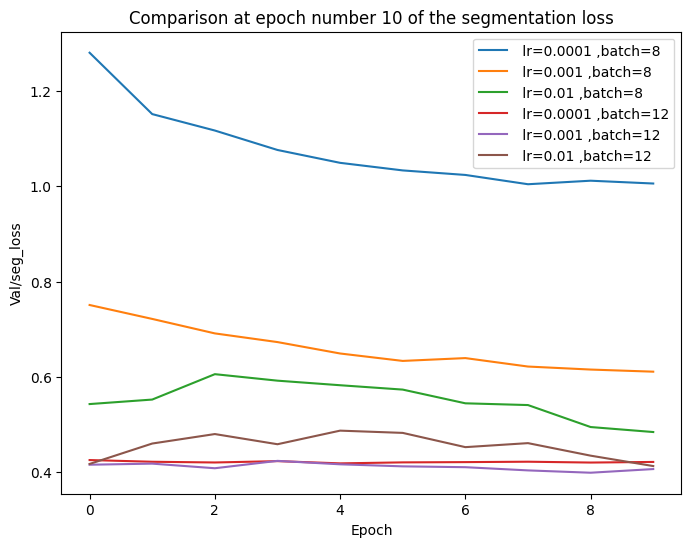

In [130]:
plt.figure(figsize=(8, 6))

for file_number in range(1, 7):

    file_data = globals()[f'file{file_number}']

    file_data.columns = file_data.columns.str.strip()

    x = file_data['epoch']
    y = file_data['val/seg_loss']

    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)
    third_number = 8 if (file_number )<= 3 else 12

    label = f' lr={second_number} ,batch={third_number}'



    plt.plot(x, y, label=label)

plt.xlabel('Epoch')
plt.ylabel('Val/seg_loss')
plt.title('Comparison at epoch number 10 of the segmentation loss')

# Display legend
plt.legend()

# Show the plot
plt.show()




**<font color="lightblue">Segmentation loss for the number 32 epochs (training)</font>**

The best result at epoch number 32 for the model with an initial learning rate (Ir) of 0.0001 and a batch size of 12

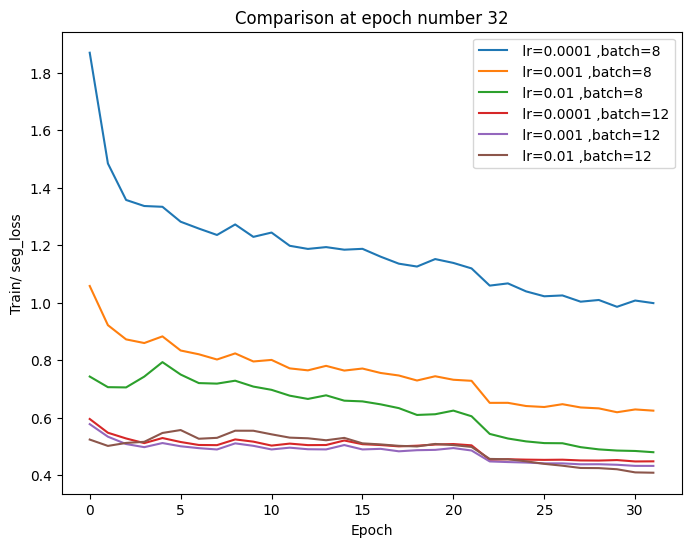

In [132]:
plt.figure(figsize=(8, 6))

for file_number in range(7, 13):

    file_data = globals()[f'file{file_number}']

    file_data.columns = file_data.columns.str.strip()

    x = file_data['epoch']
    y = file_data['train/seg_loss']

    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)
    third_number = 8 if (file_number )<= 9 else 12

    label = f' lr={second_number} ,batch={third_number}'



    plt.plot(x, y, label=label)

plt.xlabel('Epoch')
plt.ylabel('Train/ seg_loss')
plt.title('Comparison at epoch number 32')

# Display legend
plt.legend()

# Show the plot
plt.show()

**<font color="lightblue">Segmentation loss for the number 32 epochs (validating)</font>**


The best result at epoch number 30 for the model with an initial learning rate of 0.0001 and a batch size of 12

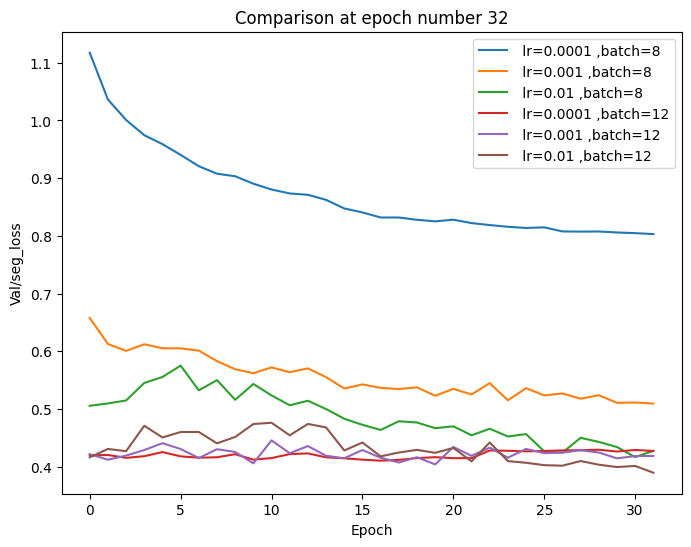

In [134]:
plt.figure(figsize=(8, 6))

for file_number in range(7, 13):

    file_data = globals()[f'file{file_number}']

    file_data.columns = file_data.columns.str.strip()

    x = file_data['epoch']
    y = file_data['val/seg_loss']

    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)

    third_number = 8 if (file_number )<= 9 else 12

    label = f' lr={second_number} ,batch={third_number}'


    plt.plot(x, y, label=label)


plt.xlabel('Epoch')
plt.ylabel('Val/seg_loss')
plt.title('Comparison at epoch number 32')

# Display legend
plt.legend()

# Show the plot
plt.show()


**<font color="lightblue">Segmentation loss for the number 40 epochs(training)</font>**

The best result at epoch number 20 for the model with an initial learning rate (Ir) of 0.0001 and a batch size of 12



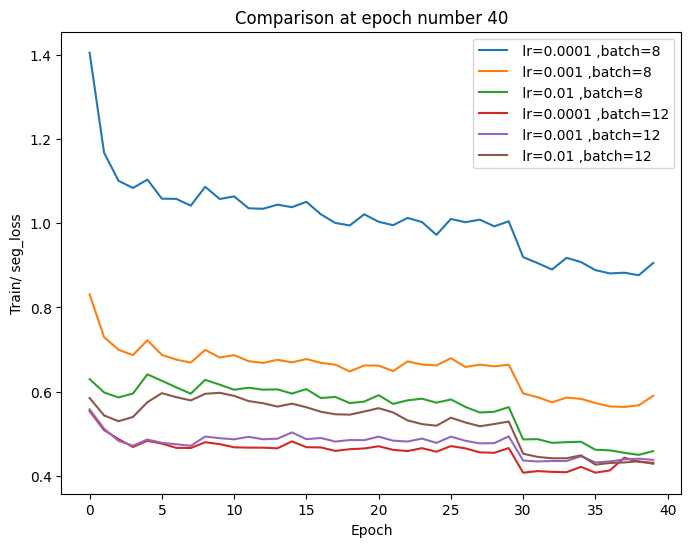

In [137]:
plt.figure(figsize=(8, 6))

for file_number in range(13, 19):

    file_data = globals()[f'file{file_number}']

    file_data.columns = file_data.columns.str.strip()

    x = file_data['epoch']
    y = file_data['train/seg_loss']

    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)

    third_number = 8 if (file_number )<= 15 else 12

    label = f' lr={second_number} ,batch={third_number}'

    plt.plot(x, y, label=label)

plt.xlabel('Epoch')
plt.ylabel('Train/ seg_loss')
plt.title('Comparison at epoch number 40')

# Display legend
plt.legend()

# Show the plot
plt.show()

**<font color="lightblue">Segmentation loss for the number 40 epochs(validating)</font>**

the best result at epoch number 40 for the model with an initial learning rate of 0.0001 and a batch size of 12

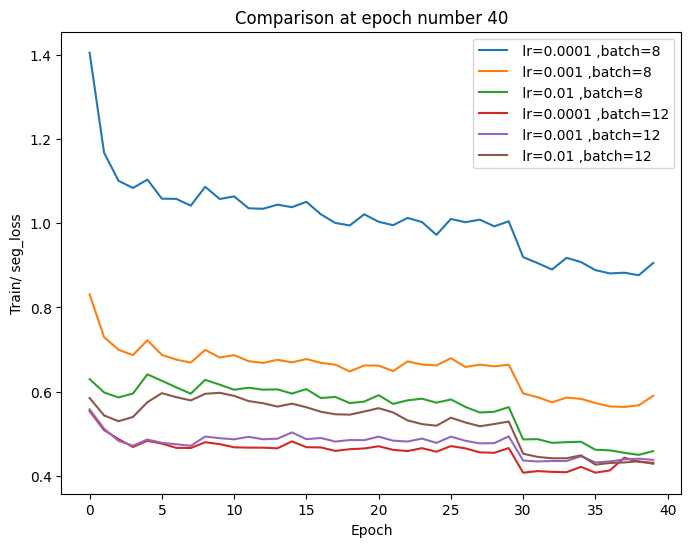

In [138]:
plt.figure(figsize=(8, 6))

for file_number in range(13, 19):

    file_data = globals()[f'file{file_number}']
    file_data.columns = file_data.columns.str.strip()

    x = file_data['epoch']
    y = file_data['train/seg_loss']


    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)

    third_number = 8 if (file_number ) <=15 else 12

    label = f' lr={second_number} ,batch={third_number}'



    plt.plot(x, y, label=label)


plt.xlabel('Epoch')
plt.ylabel('Train/ seg_loss')
plt.title('Comparison at epoch number 40')

# Display legend
plt.legend()

# Show the plot
plt.show()


**<font color="lightblue">train/seg_loss comparison of 10,32,40 epochs(training)</font>**


The best result at epoch number 40 for the model with an initial learning rate of 0.0001 and a batch size of 12. This is an excellent result, indicating that the model is able to segment the image with very high accuracy

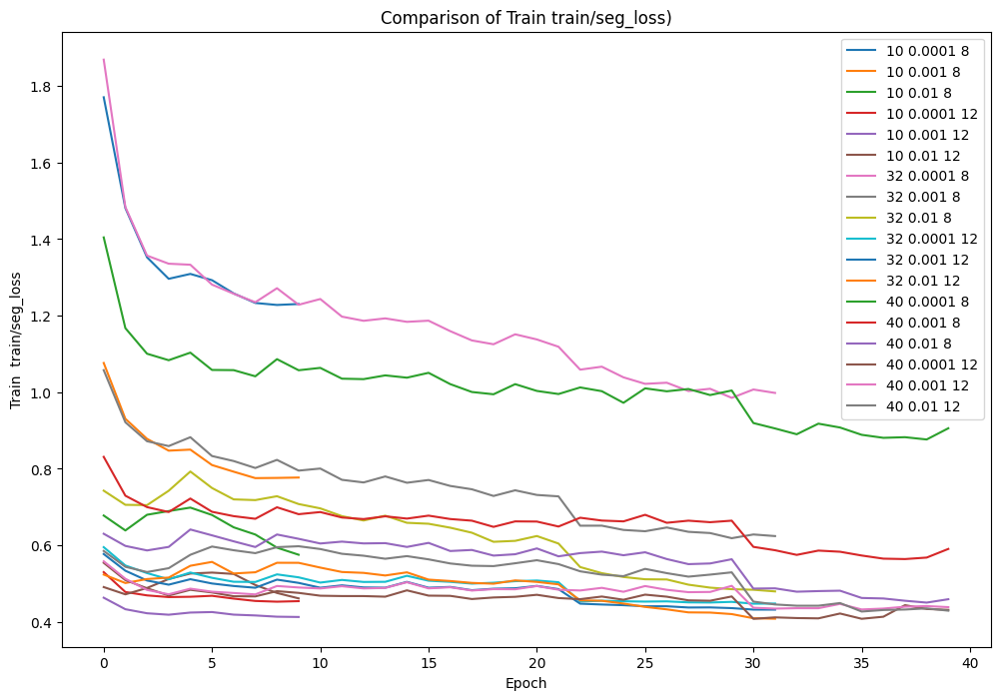

In [121]:
plt.figure(figsize=(12, 8))

for file_number in range(1, 19):

    file_data = globals()[f'file{file_number}']

    file_data.columns = file_data.columns.str.strip()

    x = file_data['epoch']
    y = file_data['train/seg_loss']

    first_number = 10 if file_number <= 6 else (32 if 6 < file_number <= 12 else 40)
    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)

    third_number = 8 if (file_number - 1) % 6 < 3 else 12

    label = f'{first_number} {second_number} {third_number}'


    plt.plot(x, y, label=label)

plt.xlabel('Epoch')
plt.ylabel('Train  train/seg_loss')
plt.title('Comparison of Train train/seg_loss)')


# Display legend
plt.legend()

# Show the plot
plt.show()


**<font color="lightblue">train/seg_loss comparison of 10,32,40 epochs(validating)</font>**


The best result at epoch number 40 for the model with an initial learning rate of 0.0001 and a batch size of 12


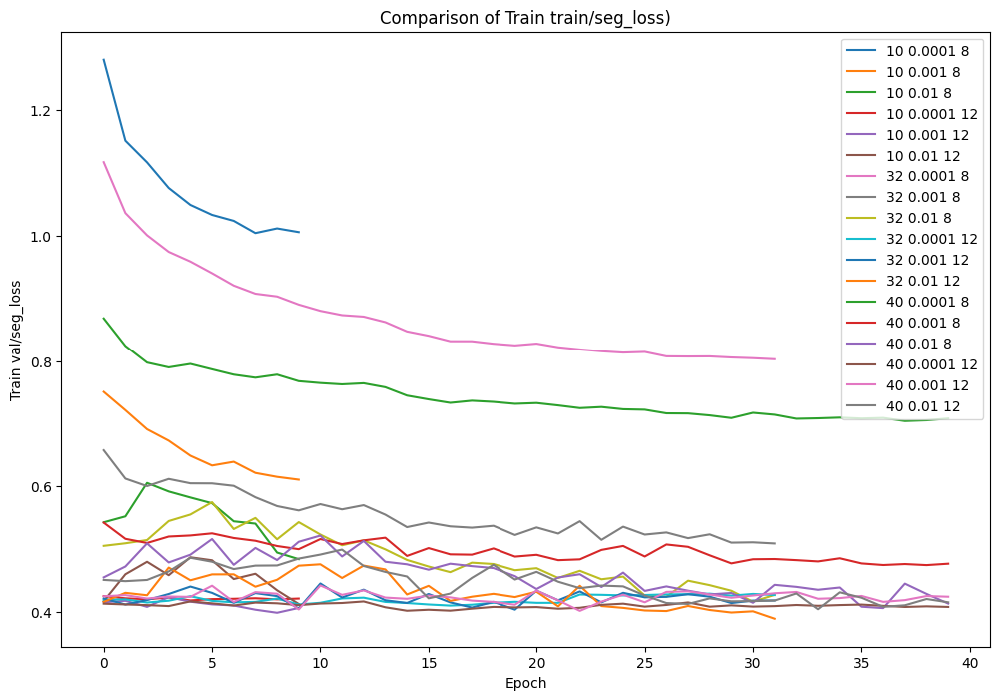

In [122]:
plt.figure(figsize=(12, 8))

for file_number in range(1, 19):

    file_data = globals()[f'file{file_number}']

    file_data.columns = file_data.columns.str.strip()


    x = file_data['epoch']
    y = file_data['val/seg_loss']


    first_number = 10 if file_number <= 6 else (32 if 6 < file_number <= 12 else 40)
    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)

    third_number = 8 if (file_number - 1) % 6 < 3 else 12

    label = f'{first_number} {second_number} {third_number}'

    plt.plot(x, y, label=label)

plt.xlabel('Epoch')
plt.ylabel('Train val/seg_loss')
plt.title('Comparison of Train train/seg_loss)')

# Display legend
plt.legend()

# Show the plot
plt.show()

🔦 Train metrics map50-95 m (mAP@[.5:.95]) is a metric used to evaluate the performance of object detection models. It is specifically designed to measure the average precision (AP) of a model at different IoU (Intersection over Union) thresholds, ranging from 0.5 to 0.95


**<font color="lightblue">metrics/mAP50-95(M) for the number 10 epochs
</font>**


The best result in  is a train metrics map50-95 m of 0.98 at epoch number 30 for the model with an initial learning rate of 0.0001 and a batch size of 12

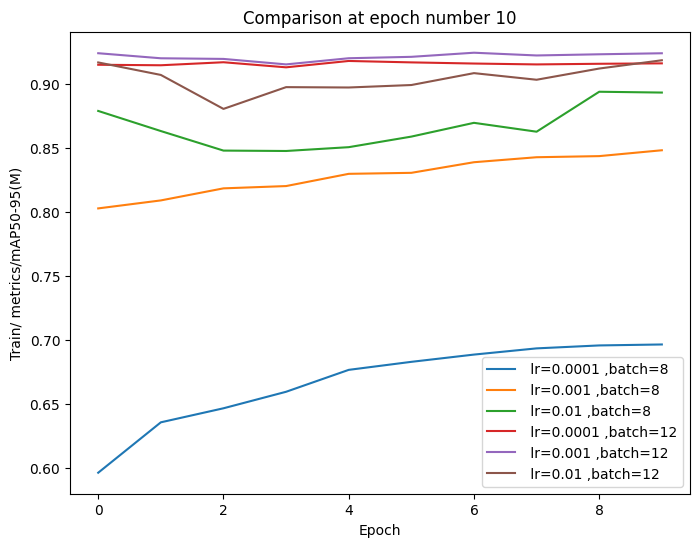

In [141]:
plt.figure(figsize=(8, 6))

for file_number in range(1, 7):

    file_data = globals()[f'file{file_number}']

    file_data.columns = file_data.columns.str.strip()

    x = file_data['epoch']
    y = file_data['metrics/mAP50-95(M)']

    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)

    third_number = 8 if (file_number ) <= 3 else 12

    label = f' lr={second_number} ,batch={third_number}'
    plt.plot(x, y, label=label)

plt.xlabel('Epoch')
plt.ylabel('Train/ metrics/mAP50-95(M)')
plt.title('Comparison at epoch number 10')

# Display legend
plt.legend()

# Show the plot
plt.show()

**<font color="lightblue">metrics/mAP50-95(M) for the number 32 epochs
</font>**

the best result is at epoch number 100 for the model with an initial learning rate of 0.0001 and a batch size of 12

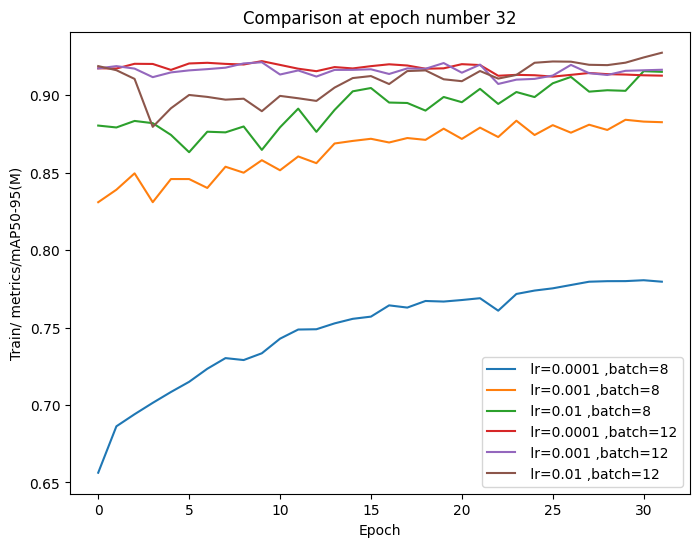

In [144]:
plt.figure(figsize=(8, 6))

for file_number in range(7, 13):
    file_data = globals()[f'file{file_number}']

    file_data.columns = file_data.columns.str.strip()

    x = file_data['epoch']
    y = file_data['metrics/mAP50-95(M)']

    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)

    third_number = 8 if (file_number ) <= 9 else 12

    label = f' lr={second_number} ,batch={third_number}'

    plt.plot(x, y, label=label)

plt.xlabel('Epoch')
plt.ylabel('Train/ metrics/mAP50-95(M)')
plt.title('Comparison at epoch number 32')

# Display legend
plt.legend()

# Show the plot
plt.show()


**<font color="lightblue">metrics/mAP50-95(M) for the number 40 epochs
</font>**

The best result  at epoch number 32 for the model with an initial learning rate of 0.0001 and a batch size of 12


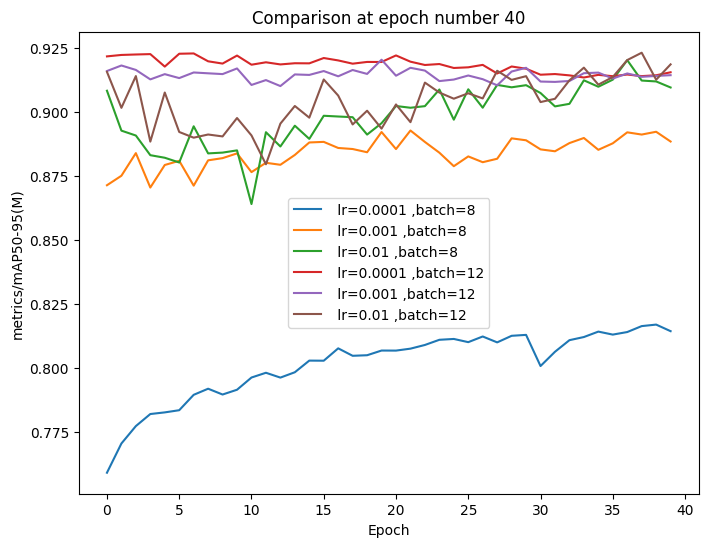

In [145]:
plt.figure(figsize=(8, 6))

for file_number in range(13, 19):

    file_data = globals()[f'file{file_number}']

    file_data.columns = file_data.columns.str.strip()

    x = file_data['epoch']
    y = file_data['metrics/mAP50-95(M)']

    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)

    third_number = 8 if (file_number )<= 15 else 12

    label = f' lr={second_number} ,batch={third_number}'

    plt.plot(x, y, label=label)


plt.xlabel('Epoch')
plt.ylabel('metrics/mAP50-95(M)')
plt.title('Comparison at epoch number 40')

# Display legend
plt.legend()

# Show the plot
plt.show()



**<font color="lightblue">metrics/mAP50-95(M) for the number 10,32,40 epochs
</font>**

The best result  at epoch number 40 for the model with an initial learning rate of 0.0001 and a batch size of 12. indicating that the model is able to detect and localize objects in the image with very high accuracy.

The mAP@[.5:.95] metric is a comprehensive measure of object detection performance, taking into account the model's ability to detect objects at different levels of accuracy. A value of 1.0 indicates that the model is able to perfectly detect and localize all objects in an image.

The fact that the model achieves a train metrics map50-95 m of 0.99 at epoch number 40 suggests that it is learning very quickly and efficiently. Additionally, the fact that the model is able to achieve such a high mAP@[.5:.95] value on a challenging image detection task.

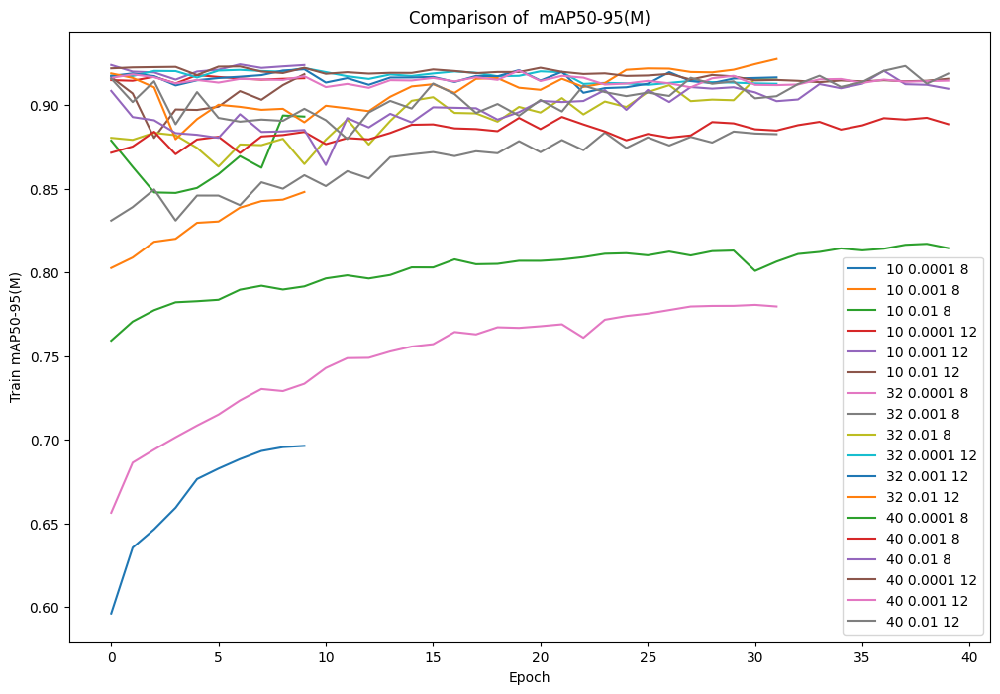

In [146]:
plt.figure(figsize=(12, 8))

for file_number in range(1, 19):

    file_data = globals()[f'file{file_number}']
    file_data.columns = file_data.columns.str.strip()

    x = file_data['epoch']
    y = file_data['metrics/mAP50-95(M)']

    first_number = 10 if file_number <= 6 else (32 if 6 < file_number <= 12 else 40)
    second_number = {0: 0.0001, 1: 0.001, 2: 0.01}.get((file_number - 1) % 3, 0.0001)

    third_number = 8 if (file_number - 1) % 6 < 3 else 12

    label = f'{first_number} {second_number} {third_number}'

    plt.plot(x, y, label=label)

plt.xlabel('Epoch')
plt.ylabel('Train mAP50-95(M)')
plt.title('Comparison of  mAP50-95(M)')

# Display legend
plt.legend()

# Show the plot
plt.show()